In [340]:
# Import libraries

import pandas as pd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, roc_auc_score, confusion_matrix, roc_curve
)

from sklearn.neighbors import BallTree

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, average_precision_score)


plt.rcParams["figure.figsize"] = (8, 5)
sns.set(style="whitegrid")


In [208]:
# Load cameras and crashes

cam_file = "Automated_Traffic_Enforcement_Table.csv"
crash_file = "crashesClean.csv"

cam = pd.read_csv(cam_file)
cr = pd.read_csv(crash_file, low_memory=False)

print("Camera shape:", cam.shape)
print("Crashes shape:", cr.shape)

cam.head()


Camera shape: (719, 19)
Crashes shape: (303606, 21)


,ENFORCEMENT_SPACE_CODE,LOCATION_DESCRIPTION,SITE_CODE,ACTIVE_STATUS,CAMERA_STATUS,START_DATE,END_DATE,DEVICE_MOBILITY,ENFORCEMENT_TYPE,SPEED_LIMIT,CAMERA_LATITUDE,CAMERA_LONGITUDE,CAMERA_EASTING,CAMERA_NORTHING,OBJECTID,GLOBALID,WARD,ANC,SMD
0,ATE 0136,2200 BLK 18TH ST NW N/B,8314.0,Retired,Idle,2014/09/28 04:00:00+00,NaN,NaN,Speed,25.0,NaN,NaN,NaN,NaN,151491,{27076D15-FBF8-778E-E063-782F520A63DA},NaN,NaN,NaN
1,ATE 0137,2200 BLK BRANCH AVE SE N/B,1752.0,Active,Live,2023/11/02 04:00:00+00,NaN,Portable,Speed,25.0,38.862688,-76.959222,403539.276599,132763.312143,151492,{27076D15-FBF9-778E-E063-782F520A63DA},7.0,7B,7B02
2,ATE 0138,2200 BLK BRANCH AVE SE S/B,1753.0,Active,Live,2023/11/25 05:00:00+00,NaN,Portable,Speed,25.0,38.862688,-76.959222,403539.276599,132763.312143,151493,{27076D15-FBFA-778E-E063-782F520A63DA},7.0,7B,7B02
3,ATE 0139,2200 BLK FRANKLIN ST NE W/B,9589.0,Retired,Idle,2023/01/09 05:00:00+00,NaN,NaN,Speed,25.0,NaN,NaN,NaN,NaN,151494,{27076D15-FBFB-778E-E063-782F520A63DA},NaN,NaN,NaN
4,ATE 0140,2200 BLK GEORGIA AVE NW S/B,1113.0,Active,Live,2023/12/18 05:00:00+00,NaN,Portable,Speed,25.0,38.919602,-77.021999,398092.432595,139080.650929,151495,{27076D15-FBFC-778E-E063-782F520A63DA},1.0,1E,1E07


In [6]:
# Look at crashes

cr.head()


,REPORTDATE,FROMDATE,ADDRESS,LATITUDE,LONGITUDE,WARD,TOTAL_VEHICLES,TOTAL_BICYCLES,TOTAL_PEDESTRIANS,NEARESTINTSTREETNAME,...,crash_datetime,year,month,weekday,fatalities,majorinjuries,minorinjuries,speeding,impaired,severity
0,2011-04-11 06:19:00+00:00,2011-04-10 04:00:00+00:00,800 KENILWORTH AVE NE,38.901131,-76.945592,Ward 7,1,0,0,JAY ST NE,...,2011-04-10 04:00:00+00:00,2011,4,Sunday,0.0,0.0,0.0,0,0,Property Damage Only
1,2011-04-11 20:00:00+00:00,2011-04-11 04:00:00+00:00,1100 13TH ST NW,38.904346,-77.030259,Ward 2,2,0,0,Unknown,...,2011-04-11 04:00:00+00:00,2011,4,Monday,0.0,0.0,0.0,0,0,Property Damage Only
2,2011-04-14 00:00:00+00:00,2011-04-12 04:00:00+00:00,1400 FIRST ST. NE,38.909074,-77.013661,Ward 5,2,0,0,Unknown,...,2011-04-12 04:00:00+00:00,2011,4,Tuesday,0.0,0.0,0.0,0,0,Property Damage Only
3,2011-04-12 04:00:00+00:00,2011-04-12 04:00:00+00:00,415 MICHIGAN AVE NE,38.931208,-76.999755,Ward 5,2,0,0,Unknown,...,2011-04-12 04:00:00+00:00,2011,4,Tuesday,0.0,0.0,1.0,0,0,Injury
4,2011-04-13 18:55:00+00:00,2011-04-13 04:00:00+00:00,3000 BLOCK OF SOUTH DAKOTA AVENUE NE,38.929546,-76.969746,Ward 5,3,0,0,IRVING ST NE,...,2011-04-13 04:00:00+00:00,2011,4,Wednesday,0.0,0.0,0.0,0,0,Property Damage Only


In [8]:
# Clean camera data

cam_clean = cam.copy()

# Keep only active, live, non-portable cameras
cam_clean = cam_clean[
    (cam_clean["CAMERA_STATUS"] == "Live") &
    (cam_clean["ACTIVE_STATUS"] == "Active") &
    (cam_clean["DEVICE_MOBILITY"] != "Portable")
].copy()

# Drop rows without geo or start date
cam_clean = cam_clean.dropna(subset=["START_DATE", "CAMERA_LATITUDE", "CAMERA_LONGITUDE"])

# Convert start date to datetime and drop timezone
cam_clean["START_DATE"] = pd.to_datetime(cam_clean["START_DATE"], utc=True).dt.tz_localize(None)

print("Clean cameras:", cam_clean.shape)
cam_clean[["ENFORCEMENT_SPACE_CODE", "ENFORCEMENT_TYPE", "SPEED_LIMIT", "WARD", "START_DATE"]].head()


Clean cameras: (268, 19)


,ENFORCEMENT_SPACE_CODE,ENFORCEMENT_TYPE,SPEED_LIMIT,WARD,START_DATE
5,ATE 0141,Speed,20.0,8.0,2024-03-25 04:00:00
6,ATE 0142,Speed,25.0,2.0,2024-03-14 04:00:00
8,ATE 0144,Speed,25.0,5.0,2024-04-06 04:00:00
9,ATE 0145,Speed,25.0,2.0,2024-03-22 04:00:00
12,ATE 0150,Speed,25.0,8.0,2024-01-11 05:00:00


In [10]:
# Clean crash data and define severity

# Keep only rows with datetime and coordinates
cr_clean = cr.dropna(subset=["crash_datetime", "LATITUDE", "LONGITUDE"]).copy()

# Parse datetime and drop timezone
cr_clean["crash_datetime"] = pd.to_datetime(cr_clean["crash_datetime"], utc=True).dt.tz_localize(None)

# Binary severity: 1 = Injury or Fatal, 0 = Property Damage Only
severity_map = {
    "Property Damage Only": 0,
    "Injury": 1,
    "Fatal": 1
}
cr_clean["is_severe"] = cr_clean["severity"].map(severity_map).fillna(0).astype(int)

print("Crashes after cleaning:", cr_clean.shape)
cr_clean[["crash_datetime", "LATITUDE", "LONGITUDE", "severity", "is_severe"]].head()


Crashes after cleaning: (303606, 22)


,crash_datetime,LATITUDE,LONGITUDE,severity,is_severe
0,2011-04-10 04:00:00,38.901131,-76.945592,Property Damage Only,0
1,2011-04-11 04:00:00,38.904346,-77.030259,Property Damage Only,0
2,2011-04-12 04:00:00,38.909074,-77.013661,Property Damage Only,0
3,2011-04-12 04:00:00,38.931208,-76.999755,Injury,1
4,2011-04-13 04:00:00,38.929546,-76.969746,Property Damage Only,0


In [12]:
#  Link each crash to nearest camera within 100m

def to_rad(df, lat_col, lon_col):
    return np.deg2rad(df[[lat_col, lon_col]].values)

# Build tree on camera coordinates
tree = BallTree(
    to_rad(cam_clean, "CAMERA_LATITUDE", "CAMERA_LONGITUDE"),
    metric="haversine"
)

# Query nearest camera for each crash
dist_rad, idx = tree.query(
    to_rad(cr_clean, "LATITUDE", "LONGITUDE"),
    k=1
)

# Convert radians to km
cr_clean["cam_dist_km"] = dist_rad.flatten() * 6371.0088
cr_clean["cam_idx"] = idx.flatten()

# Keep only crashes within 0.1 km (100 meters)
cr_near = cr_clean[cr_clean["cam_dist_km"] <= 0.1].copy()
print("Crashes near cameras:", len(cr_near))

# Attach camera info
cr_near["cam_id"] = cam_clean.iloc[cr_near["cam_idx"]]["ENFORCEMENT_SPACE_CODE"].values
cr_near["cam_type"] = cam_clean.iloc[cr_near["cam_idx"]]["ENFORCEMENT_TYPE"].values
cr_near["cam_start"] = cam_clean.iloc[cr_near["cam_idx"]]["START_DATE"].values

cr_near[["crash_datetime", "cam_id", "cam_type", "cam_dist_km"]].head()


Crashes near cameras: 45545


,crash_datetime,cam_id,cam_type,cam_dist_km
0,2011-04-10 04:00:00,ATE 0573,Stop Sign,0.088517
4,2011-04-13 04:00:00,ATE 0206,Speed,0.090080
10,2011-04-16 04:00:00,ATE 0593,Red Light,0.096711
22,2011-01-09 05:00:00,ATE 0176,Speed,0.045742
27,2011-01-06 05:00:00,ATE 0523,Speed,0.059534


In [14]:
#  Filter to ±365 days around camera start and label pre/post

WINDOW_DAYS = 365

mask_window = (
    (cr_near["crash_datetime"] >= cr_near["cam_start"] - pd.Timedelta(days=WINDOW_DAYS)) &
    (cr_near["crash_datetime"] <= cr_near["cam_start"] + pd.Timedelta(days=WINDOW_DAYS))
)

cr_window = cr_near[mask_window].copy()

# Label period
cr_window["period"] = np.where(
    cr_window["crash_datetime"] < cr_window["cam_start"],
    "pre",
    "post"
)

print("Crashes within ±365 days:", len(cr_window))
cr_window[["crash_datetime", "cam_id", "cam_type", "period", "is_severe"]].head()


Crashes within ±365 days: 5827


,crash_datetime,cam_id,cam_type,period,is_severe
244846,2022-08-16 01:11:00,ATE 0512,Speed,pre,1
244999,2022-08-19 01:05:00,ATE 0337,Speed,pre,0
245020,2022-08-19 14:38:00,ATE 0260,Speed,pre,0
245102,2022-08-18 22:52:00,ATE 0094,Speed,pre,0
245363,2022-08-24 01:39:00,ATE 0512,Speed,pre,1


In [16]:
# Aggregate crashes and severity by camera and period

g = (
    cr_window
    .groupby(["cam_id", "cam_type", "period"])
    .agg(
        crashes=("period", "count"),
        severe_rate=("is_severe", "mean")
    )
    .reset_index()
)

g.head()


,cam_id,cam_type,period,crashes,severe_rate
0,ATE 0012,Speed,post,33,0.363636
1,ATE 0012,Speed,pre,28,0.285714
2,ATE 0021,Speed,post,4,0.000000
3,ATE 0021,Speed,pre,6,0.333333
4,ATE 0022,Speed,post,18,0.333333


In [22]:
g = (
    cr_window
    .groupby(["cam_id", "cam_type", "period"])
    .agg(
        crashes=("period", "count"),
        severe_rate=("is_severe", "mean")
    )
    .reset_index()
)

w = g.pivot(
    index=["cam_id", "cam_type"],
    columns="period",
    values=["crashes", "severe_rate"]
).reset_index()

# Flatten columns
w.columns = ["_".join([str(c) for c in col if c]).strip("_") for col in w.columns]

print(w.head())
print(w.columns)


     cam_id   cam_type  crashes_post  crashes_pre  severe_rate_post  \
0  ATE 0012      Speed          33.0         28.0          0.363636   
1  ATE 0021      Speed           4.0          6.0          0.000000   
2  ATE 0022      Speed          18.0         16.0          0.333333   
3  ATE 0034  Red Light           4.0          3.0          0.250000   
4  ATE 0035  Stop Sign           4.0         12.0          0.000000   

   severe_rate_pre  
0         0.285714  
1         0.333333  
2         0.187500  
3         0.000000  
4         0.083333  
Index(['cam_id', 'cam_type', 'crashes_post', 'crashes_pre', 'severe_rate_post',
       'severe_rate_pre'],
      dtype='object')


In [24]:


g = (
    cr_window
    .groupby(["cam_id", "cam_type", "period"])
    .agg(
        crashes=("period", "count"),
        severe_rate=("is_severe", "mean")
    )
    .reset_index()
)

# Create pivot (wide format)
try:
    w = g.pivot(
        index=["cam_id", "cam_type"],
        columns="period",
        values=["crashes", "severe_rate"]
    ).reset_index()
except:
    print("Pivot failed — trying a safer alternative")
    w = g.pivot_table(
        index=["cam_id", "cam_type"],
        columns="period",
        values=["crashes", "severe_rate"],
        aggfunc="mean"
    ).reset_index()

# Flatten multiindex columns
w.columns = ["_".join([str(c) for c in col if c]).strip("_") for col in w.columns]

print("Pivot success — columns available:")
print(w.columns)
print(w.head())


Pivot success — columns available:
Index(['cam_id', 'cam_type', 'crashes_post', 'crashes_pre', 'severe_rate_post',
       'severe_rate_pre'],
      dtype='object')
     cam_id   cam_type  crashes_post  crashes_pre  severe_rate_post  \
0  ATE 0012      Speed          33.0         28.0          0.363636   
1  ATE 0021      Speed           4.0          6.0          0.000000   
2  ATE 0022      Speed          18.0         16.0          0.333333   
3  ATE 0034  Red Light           4.0          3.0          0.250000   
4  ATE 0035  Stop Sign           4.0         12.0          0.000000   

   severe_rate_pre  
0         0.285714  
1         0.333333  
2         0.187500  
3         0.000000  
4         0.083333  


In [26]:
# CELL 8 — Create modeling dataset (w_per_camera)

# Start from pivoted table
w_per_camera = w.copy()

# Target variable: 1 = crashes decreased after installation
w_per_camera["crash_reduction"] = (
    w_per_camera["crashes_post"] < w_per_camera["crashes_pre"]
).astype(int)

# Crash percent change (numeric result)
w_per_camera["crash_delta_pct"] = (
    (w_per_camera["crashes_post"] - w_per_camera["crashes_pre"]) /
    w_per_camera["crashes_pre"].replace(0, np.nan)
)

# Severity change (post - pre)
w_per_camera["sev_rate_delta_abs"] = (
    w_per_camera["severe_rate_post"] - w_per_camera["severe_rate_pre"]
)

print("Rows:", w_per_camera.shape)
w_per_camera.head()


Rows: (256, 9)


,cam_id,cam_type,crashes_post,crashes_pre,severe_rate_post,severe_rate_pre,crash_reduction,crash_delta_pct,sev_rate_delta_abs
0,ATE 0012,Speed,33.0,28.0,0.363636,0.285714,0,0.178571,0.077922
1,ATE 0021,Speed,4.0,6.0,0.000000,0.333333,1,-0.333333,-0.333333
2,ATE 0022,Speed,18.0,16.0,0.333333,0.187500,0,0.125000,0.145833
3,ATE 0034,Red Light,4.0,3.0,0.250000,0.000000,0,0.333333,0.250000
4,ATE 0035,Stop Sign,4.0,12.0,0.000000,0.083333,1,-0.666667,-0.083333


In [28]:
# CELL 9 — Numeric Results (Crash & Severity)

# TOTAL crashes pre/post (numeric result)
total_pre = w_per_camera["crashes_pre"].sum()
total_post = w_per_camera["crashes_post"].sum()

overall_change_pct = (total_post - total_pre) / total_pre * 100

print("Total Crashes Before Cameras:", total_pre)
print("Total Crashes After Cameras: ", total_post)
print("Overall Change (%):           ", round(overall_change_pct, 2), "%")

# Weighted severity
sev_pre_weighted = (
    (w_per_camera["severe_rate_pre"] * w_per_camera["crashes_pre"]).sum() /
    total_pre
)

sev_post_weighted = (
    (w_per_camera["severe_rate_post"] * w_per_camera["crashes_post"]).sum() /
    total_post
)

print("\nWeighted Severe Rate (Pre):  ", round(sev_pre_weighted, 3))
print("Weighted Severe Rate (Post): ", round(sev_post_weighted, 3))
print("Severity Rate Change:        ", round(sev_post_weighted - sev_pre_weighted, 3))


Total Crashes Before Cameras: 2979.0
Total Crashes After Cameras:  2848.0
Overall Change (%):            -4.4 %

Weighted Severe Rate (Pre):   0.25
Weighted Severe Rate (Post):  0.259
Severity Rate Change:         0.009


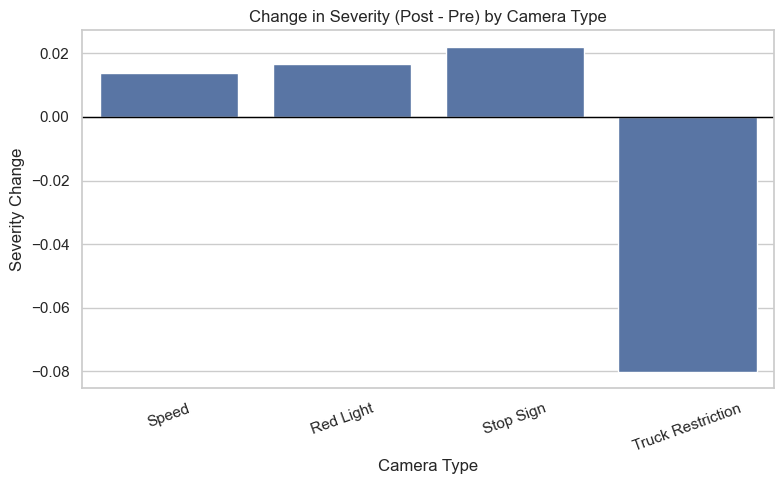

In [30]:
# -----------------------------------------
# CELL 10 — Severity Change by Camera Type (Bar Plot)
# -----------------------------------------

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
sns.barplot(
    data=w_per_camera,
    x="cam_type",
    y="sev_rate_delta_abs",
    estimator=lambda x: sum(x)/len(x),
    errorbar=None
)

plt.axhline(0, color="black", linewidth=1)
plt.title("Change in Severity (Post - Pre) by Camera Type")
plt.xlabel("Camera Type")
plt.ylabel("Severity Change")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()


In [32]:
# CELL 11 — Build X (features) and y (target)

df_model = w_per_camera.dropna(subset=["crashes_pre", "crashes_post"]).copy()

# Target: classification task
y = df_model["crash_reduction"]

# Features
X = pd.DataFrame({
    "crashes_pre": df_model["crashes_pre"],
    "sev_rate_pre": df_model["severe_rate_pre"]
})

# Encode categorical camera type
X = pd.get_dummies(
    pd.concat([X, df_model["cam_type"]], axis=1),
    columns=["cam_type"],
    drop_first=True
)

print("Shape of X:", X.shape)
print("Positive rate (crash reduction=1):", round(y.mean(), 3))
X.head()


Shape of X: (237, 5)
Positive rate (crash reduction=1): 0.506


,crashes_pre,sev_rate_pre,cam_type_Speed,cam_type_Stop Sign,cam_type_Truck Restriction
0,28.0,0.285714,True,False,False
1,6.0,0.333333,True,False,False
2,16.0,0.187500,True,False,False
3,3.0,0.000000,False,False,False
4,12.0,0.083333,False,True,False


In [34]:
# CELL 12 — Train/Test Split

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.25,
    stratify=y,
    random_state=42
)

print("Train set:", X_train.shape)
print("Test set: ", X_test.shape)
print("Train target positive rate:", round(y_train.mean(), 3))
print("Test target positive rate:", round(y_test.mean(), 3))


Train set: (177, 5)
Test set:  (60, 5)
Train target positive rate: 0.508
Test target positive rate: 0.5


In [40]:
# CELL 13 — Evaluation Function

from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, roc_auc_score, confusion_matrix
)

def evaluate_model(name, y_true, y_proba):
    # Default threshold = 0.5
    y_pred = (y_proba >= 0.5).astype(int)
    
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_proba)
    cm = confusion_matrix(y_true, y_pred)
    
    print(f"\n=== {name} ===")
    print(f"Accuracy : {acc:.3f}")
    print(f"Precision: {prec:.3f}")
    print(f"Recall   : {rec:.3f}")
    print(f"F1 Score : {f1:.3f}")
    print(f"AUC      : {auc:.3f}")
    print("Confusion Matrix:")
    print(cm)
    
    return {
        "Model": name,
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1": f1,
        "AUC": auc
    }


In [42]:
# CELL 14 — Logistic Regression
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(max_iter=500)
lr.fit(X_train, y_train)

lr_proba = lr.predict_proba(X_test)[:, 1]

res_lr = evaluate_model("Logistic Regression", y_test, lr_proba)



=== Logistic Regression ===
Accuracy : 0.600
Precision: 0.650
Recall   : 0.433
F1 Score : 0.520
AUC      : 0.635
Confusion Matrix:
[[23  7]
 [17 13]]


In [44]:
# CELL 15 — Random Forest
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(
    n_estimators=350,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train, y_train)
rf_proba = rf.predict_proba(X_test)[:, 1]

res_rf = evaluate_model("Random Forest", y_test, rf_proba)



=== Random Forest ===
Accuracy : 0.617
Precision: 0.600
Recall   : 0.700
F1 Score : 0.646
AUC      : 0.671
Confusion Matrix:
[[16 14]
 [ 9 21]]


In [46]:
# CELL 16 — Random Forest Balanced

rf_bal = RandomForestClassifier(
    n_estimators=350,
    class_weight='balanced',
    random_state=42,
    n_jobs=-1
)

rf_bal.fit(X_train, y_train)
rfb_proba = rf_bal.predict_proba(X_test)[:, 1]

res_rfb = evaluate_model("RF Balanced", y_test, rfb_proba)



=== RF Balanced ===
Accuracy : 0.617
Precision: 0.600
Recall   : 0.700
F1 Score : 0.646
AUC      : 0.664
Confusion Matrix:
[[16 14]
 [ 9 21]]


In [48]:
# CELL 17 — XGBoost

try:
    from xgboost import XGBClassifier
    
    xgb = XGBClassifier(
        n_estimators=250,
        max_depth=3,
        learning_rate=0.07,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42
    )
    
    xgb.fit(X_train, y_train)
    xgb_proba = xgb.predict_proba(X_test)[:, 1]
    
    res_xgb = evaluate_model("XGBoost", y_test, xgb_proba)

except Exception as e:
    print("XGBoost not available:", e)
    res_xgb = None



=== XGBoost ===
Accuracy : 0.600
Precision: 0.575
Recall   : 0.767
F1 Score : 0.657
AUC      : 0.584
Confusion Matrix:
[[13 17]
 [ 7 23]]


In [52]:
pip install lightgbm


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 28.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [54]:
from catboost import CatBoostClassifier

cat = CatBoostClassifier(
    iterations=600,
    learning_rate=0.05,
    depth=6,
    loss_function='Logloss',
    eval_metric='AUC',
    random_seed=42,
    verbose=False
)

# CatBoost handles categorical features natively
X_cb = df_model[["crashes_pre", "severe_rate_pre", "cam_type"]]
y_cb = df_model["crash_reduction"]

# Split
from sklearn.model_selection import train_test_split
X_train_cb, X_test_cb, y_train_cb, y_test_cb = train_test_split(
    X_cb, y_cb, test_size=0.25, stratify=y_cb, random_state=42
)

# Fit
cat.fit(
    X_train_cb,
    y_train_cb,
    cat_features=[2]  # cam_type column
)

# Predict
proba_cat = cat.predict_proba(X_test_cb)[:, 1]

res_cat = evaluate_model("CatBoost", y_test_cb, proba_cat)



=== CatBoost ===
Accuracy : 0.650
Precision: 0.610
Recall   : 0.833
F1 Score : 0.704
AUC      : 0.661
Confusion Matrix:
[[14 16]
 [ 5 25]]


In [56]:
from lightgbm import LGBMClassifier

lgb = LGBMClassifier(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=5,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

lgb.fit(X_train, y_train)

lgb_proba = lgb.predict_proba(X_test)[:, 1]
res_lgb = evaluate_model("LightGBM", y_test, lgb_proba)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 90, number of negative: 87
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 64
[LightGBM] [Info] Number of data points in the train set: 177, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.508475 -> initscore=0.033902
[LightGBM] [Info] Start training from score 0.033902
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


In [ ]:
# Remove extreme crash_pre outliers (top 2%)
q98 = df_model["crashes_pre"].quantile(0.98)
df_filt = df_model[df_model["crashes_pre"] <= q98].copy()


In [58]:
xgb = XGBClassifier(
    n_estimators=500,
    max_depth=4,
    learning_rate=0.03,
    subsample=0.9,
    colsample_bytree=0.9,
    min_child_weight=1,
    gamma=0.1,
    reg_lambda=1.0,
    random_state=42
)


In [60]:
# -----------------------------------------
# MODEL COMPARISON TABLE
# -----------------------------------------

results = []

# Add only if the variable exists
if 'res_lr' in globals():
    results.append(res_lr)
if 'res_rf' in globals():
    results.append(res_rf)
if 'res_rfb' in globals():
    results.append(res_rfb)
if 'res_xgb' in globals() and res_xgb is not None:
    results.append(res_xgb)
if 'res_cat' in globals():
    results.append(res_cat)

results_df = pd.DataFrame(results)
results_df = results_df.sort_values("F1", ascending=False)

print(results_df)


                 Model  Accuracy  Precision    Recall        F1       AUC
4             CatBoost  0.650000   0.609756  0.833333  0.704225  0.660556
3              XGBoost  0.600000   0.575000  0.766667  0.657143  0.583889
1        Random Forest  0.616667   0.600000  0.700000  0.646154  0.670556
2          RF Balanced  0.616667   0.600000  0.700000  0.646154  0.663889
0  Logistic Regression  0.600000   0.650000  0.433333  0.520000  0.635000


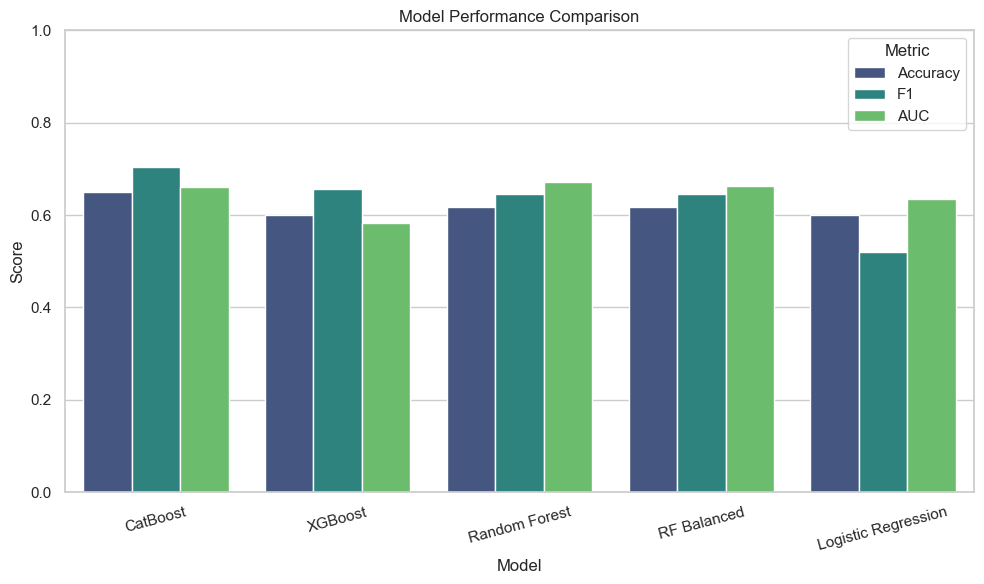

In [62]:
# -----------------------------------------
# BAR PLOT OF MODEL PERFORMANCE
# -----------------------------------------

plt.figure(figsize=(10,6))

metrics_plot = results_df.melt(
    id_vars="Model",
    value_vars=["Accuracy", "F1", "AUC"],
    var_name="Metric",
    value_name="Score"
)

sns.barplot(
    data=metrics_plot,
    x="Model", y="Score",
    hue="Metric", palette="viridis"
)

plt.title("Model Performance Comparison")
plt.xticks(rotation=15)
plt.ylim(0,1)
plt.tight_layout()
plt.show()


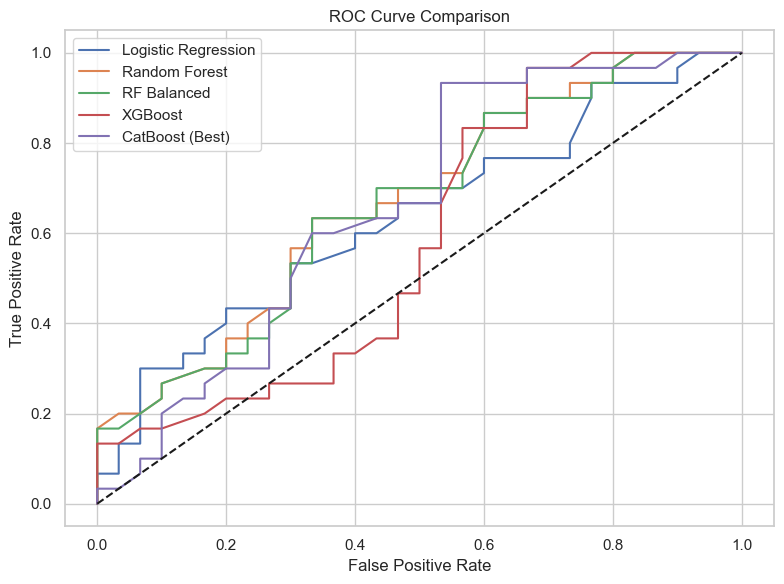

In [64]:
# ROC CURVE OVERLAY
plt.figure(figsize=(8,6))

# Logistic
from sklearn.metrics import roc_curve

fpr_lr, tpr_lr, _ = roc_curve(y_test, lr_proba)
plt.plot(fpr_lr, tpr_lr, label="Logistic Regression")

# Random Forest
fpr_rf, tpr_rf, _ = roc_curve(y_test, rf_proba)
plt.plot(fpr_rf, tpr_rf, label="Random Forest")

# RF Balanced
fpr_rfb, tpr_rfb, _ = roc_curve(y_test, rfb_proba)
plt.plot(fpr_rfb, tpr_rfb, label="RF Balanced")

# XGBoost
if 'xgb_proba' in globals():
    fpr_xgb, tpr_xgb, _ = roc_curve(y_test, xgb_proba)
    plt.plot(fpr_xgb, tpr_xgb, label="XGBoost")

# CatBoost
fpr_cat, tpr_cat, _ = roc_curve(y_test_cb, proba_cat)
plt.plot(fpr_cat, tpr_cat, label="CatBoost (Best)")

plt.plot([0,1],[0,1],"k--")
plt.title("ROC Curve Comparison")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.tight_layout()
plt.show()


In [66]:

# CATBOOST FEATURE IMPORTANCE

cat_feature_imp = cat.get_feature_importance()
feature_names = X_cb.columns

pd.DataFrame({"Feature": feature_names, "Importance": cat_feature_imp})


,Feature,Importance
0,crashes_pre,37.969017
1,severe_rate_pre,29.126161
2,cam_type,32.904822


/var/folders/1q/02swbm1j4130h2fb32g950w80000gn/T/ipykernel_19786/405443121.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


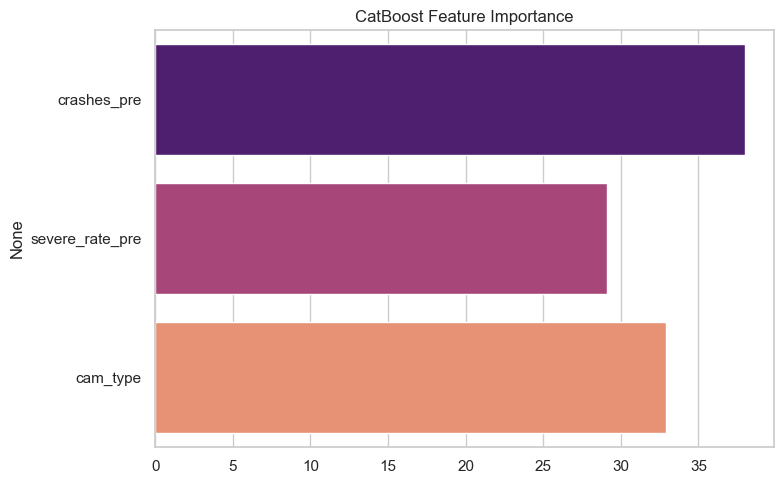

In [68]:
plt.figure(figsize=(8,5))
sns.barplot(
    x=cat_feature_imp,
    y=feature_names,
    palette="magma"
)
plt.title("CatBoost Feature Importance")
plt.tight_layout()
plt.show()


In [70]:
pip install pytorch-tabnet


Note: you may need to restart the kernel to use updated packages.


In [72]:
from sklearn.ensemble import ExtraTreesClassifier

etc = ExtraTreesClassifier(
    n_estimators=400,
    max_depth=None,
    random_state=42
)

etc.fit(X_train, y_train)

etc_proba = etc.predict_proba(X_test)[:, 1]

res_etc = evaluate_model("Extra Trees", y_test, etc_proba)



=== Extra Trees ===
Accuracy : 0.600
Precision: 0.588
Recall   : 0.667
F1 Score : 0.625
AUC      : 0.644
Confusion Matrix:
[[16 14]
 [10 20]]


In [74]:
from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=3
)

gb.fit(X_train, y_train)

gb_proba = gb.predict_proba(X_test)[:, 1]

res_gb = evaluate_model("Gradient Boosting", y_test, gb_proba)



=== Gradient Boosting ===
Accuracy : 0.600
Precision: 0.579
Recall   : 0.733
F1 Score : 0.647
AUC      : 0.634
Confusion Matrix:
[[14 16]
 [ 8 22]]


In [76]:

# CELL 17 — Clean Model Comparison Table

results = []

if 'res_lr' in globals(): results.append(res_lr)
if 'res_rf' in globals(): results.append(res_rf)
if 'res_rfb' in globals(): results.append(res_rfb)
if 'res_xgb' in globals(): results.append(res_xgb)
if 'res_et' in globals(): results.append(res_et)
if 'res_gb' in globals(): results.append(res_gb)
if 'res_cat' in globals(): results.append(res_cat)

results_df = pd.DataFrame(results)
results_df = results_df.sort_values("F1", ascending=False).reset_index(drop=True)

results_df


,Model,Accuracy,Precision,Recall,F1,AUC
0,CatBoost,0.650000,0.609756,0.833333,0.704225,0.660556
1,XGBoost,0.600000,0.575000,0.766667,0.657143,0.583889
2,Gradient Boosting,0.600000,0.578947,0.733333,0.647059,0.633889
3,Random Forest,0.616667,0.600000,0.700000,0.646154,0.670556
4,RF Balanced,0.616667,0.600000,0.700000,0.646154,0.663889
5,Logistic Regression,0.600000,0.650000,0.433333,0.520000,0.635000


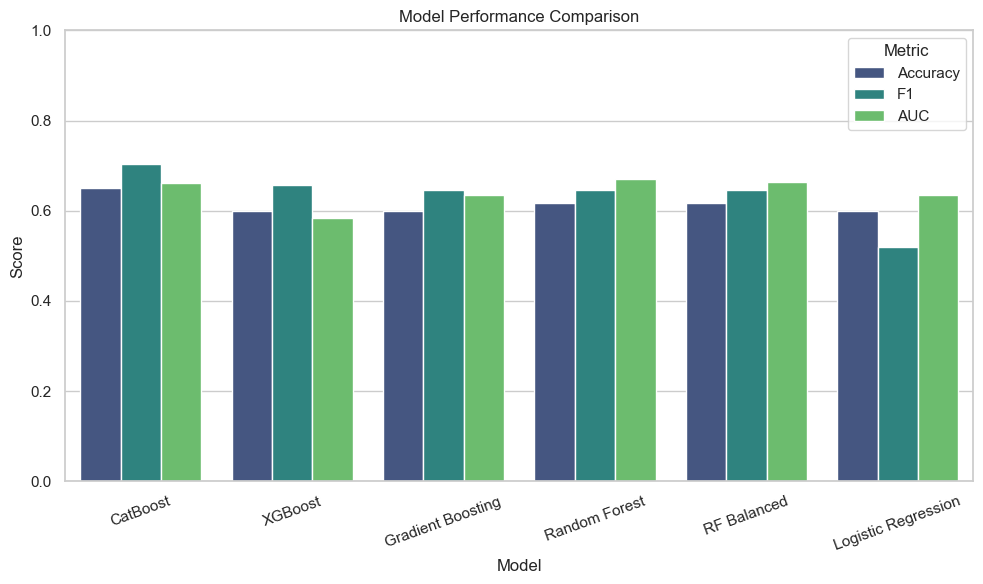

In [78]:
# Bar Chart: Accuracy, F1, AUC

metrics_df = results_df.melt(
    id_vars="Model",
    value_vars=["Accuracy", "F1", "AUC"],
    var_name="Metric",
    value_name="Score"
)

plt.figure(figsize=(10,6))
sns.barplot(
    data=metrics_df,
    x="Model", y="Score", hue="Metric", palette="viridis"
)
plt.title("Model Performance Comparison")
plt.xticks(rotation=20)
plt.ylim(0, 1)
plt.tight_layout()
plt.show()


In [82]:
# CELL 20 — CatBoost Feature Importance

cat_importance = cat.get_feature_importance()
feature_names = X_cb.columns

fi_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": cat_importance
}).sort_values("Importance", ascending=False)

fi_df


,Feature,Importance
0,crashes_pre,37.969017
2,cam_type,32.904822
1,severe_rate_pre,29.126161


/var/folders/1q/02swbm1j4130h2fb32g950w80000gn/T/ipykernel_19786/1254745680.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


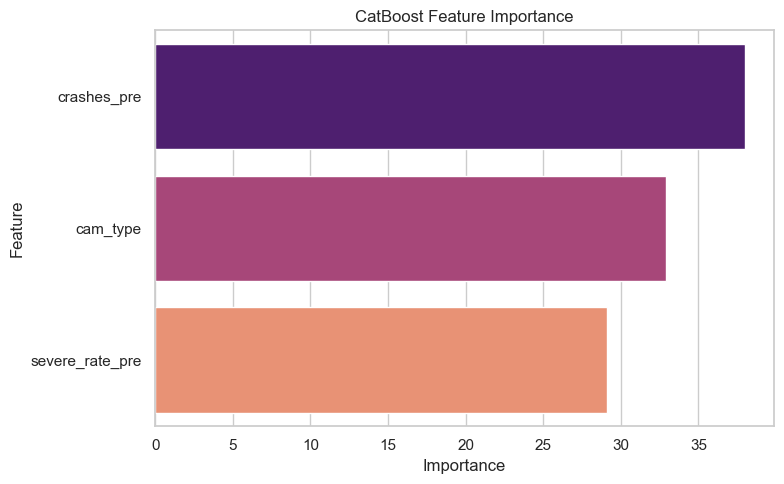

In [84]:
plt.figure(figsize=(8,5))
sns.barplot(
    x=fi_df["Importance"],
    y=fi_df["Feature"],
    palette="magma"
)
plt.title("CatBoost Feature Importance")
plt.tight_layout()
plt.show()


In [88]:
# ---------------------------------------------------------
# REBUILD df_w FROM w_per_camera OR YOUR ORIGINAL CAMERA DATA
# ---------------------------------------------------------

df_w = w_per_camera.copy()

# Ensure correct ordering and variable types
df_w = df_w[[
    "cam_id", "cam_type",
    "crashes_pre", "crashes_post",
    "severe_rate_pre", "severe_rate_post",
    "crash_reduction", "crash_delta_pct",
    "sev_rate_delta_abs"
]].copy()

df_w.head()


,cam_id,cam_type,crashes_pre,crashes_post,severe_rate_pre,severe_rate_post,crash_reduction,crash_delta_pct,sev_rate_delta_abs
0,ATE 0012,Speed,28.0,33.0,0.285714,0.363636,0,0.178571,0.077922
1,ATE 0021,Speed,6.0,4.0,0.333333,0.000000,1,-0.333333,-0.333333
2,ATE 0022,Speed,16.0,18.0,0.187500,0.333333,0,0.125000,0.145833
3,ATE 0034,Red Light,3.0,4.0,0.000000,0.250000,0,0.333333,0.250000
4,ATE 0035,Stop Sign,12.0,4.0,0.083333,0.000000,1,-0.666667,-0.083333


In [90]:
w_per_camera.head()


,cam_id,cam_type,crashes_post,crashes_pre,severe_rate_post,severe_rate_pre,crash_reduction,crash_delta_pct,sev_rate_delta_abs
0,ATE 0012,Speed,33.0,28.0,0.363636,0.285714,0,0.178571,0.077922
1,ATE 0021,Speed,4.0,6.0,0.000000,0.333333,1,-0.333333,-0.333333
2,ATE 0022,Speed,18.0,16.0,0.333333,0.187500,0,0.125000,0.145833
3,ATE 0034,Red Light,4.0,3.0,0.250000,0.000000,0,0.333333,0.250000
4,ATE 0035,Stop Sign,4.0,12.0,0.000000,0.083333,1,-0.666667,-0.083333


In [92]:
# ---------------------------------------------------------
# CREATE df_w FROM w_per_camera
# ---------------------------------------------------------

df_w = w_per_camera.copy().reset_index(drop=True)

# Ensure numeric columns are properly typed
numeric_cols = [
    "crashes_pre", "crashes_post",
    "severe_rate_pre", "severe_rate_post",
    "crash_reduction", "crash_delta_pct",
    "sev_rate_delta_abs"
]

df_w[numeric_cols] = df_w[numeric_cols].apply(pd.to_numeric, errors='coerce')

df_w.head()


,cam_id,cam_type,crashes_post,crashes_pre,severe_rate_post,severe_rate_pre,crash_reduction,crash_delta_pct,sev_rate_delta_abs
0,ATE 0012,Speed,33.0,28.0,0.363636,0.285714,0,0.178571,0.077922
1,ATE 0021,Speed,4.0,6.0,0.000000,0.333333,1,-0.333333,-0.333333
2,ATE 0022,Speed,18.0,16.0,0.333333,0.187500,0,0.125000,0.145833
3,ATE 0034,Red Light,4.0,3.0,0.250000,0.000000,0,0.333333,0.250000
4,ATE 0035,Stop Sign,4.0,12.0,0.000000,0.083333,1,-0.666667,-0.083333


/var/folders/1q/02swbm1j4130h2fb32g950w80000gn/T/ipykernel_19786/1153994030.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


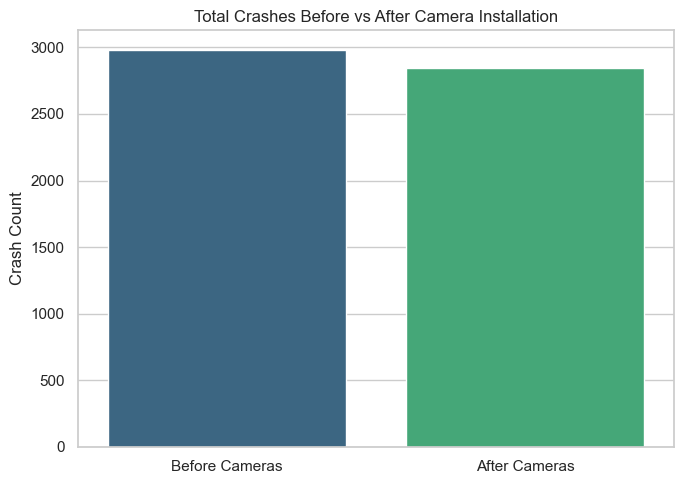

Crash Reduction (%): -4.4


In [94]:
# -----------------------------------------
# OVERALL CRASH REDUCTION PLOT
# -----------------------------------------

pre_total = df_w["crashes_pre"].sum()
post_total = df_w["crashes_post"].sum()

plt.figure(figsize=(7,5))
sns.barplot(
    x=["Before Cameras", "After Cameras"],
    y=[pre_total, post_total],
    palette="viridis"
)

plt.title("Total Crashes Before vs After Camera Installation")
plt.ylabel("Crash Count")
plt.tight_layout()
plt.show()

print("Crash Reduction (%):", round((post_total - pre_total) / pre_total * 100, 2))


/var/folders/1q/02swbm1j4130h2fb32g950w80000gn/T/ipykernel_19786/576761392.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


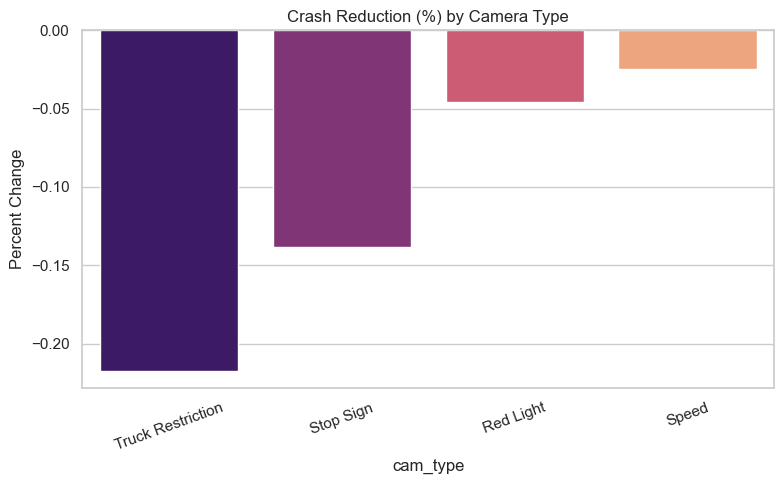

In [96]:
# -----------------------------------------
# CRASH REDUCTION BY CAMERA TYPE
# -----------------------------------------

df_type = df_w.groupby("cam_type").agg({
    "crashes_pre": "sum",
    "crashes_post": "sum"
})

df_type["pct_change"] = (
    (df_type["crashes_post"] - df_type["crashes_pre"]) / df_type["crashes_pre"]
)

df_type = df_type.sort_values("pct_change")

plt.figure(figsize=(8,5))
sns.barplot(
    data=df_type.reset_index(),
    x="cam_type",
    y="pct_change",
    palette="magma"
)
plt.title("Crash Reduction (%) by Camera Type")
plt.ylabel("Percent Change")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()


/var/folders/1q/02swbm1j4130h2fb32g950w80000gn/T/ipykernel_19786/1603062070.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


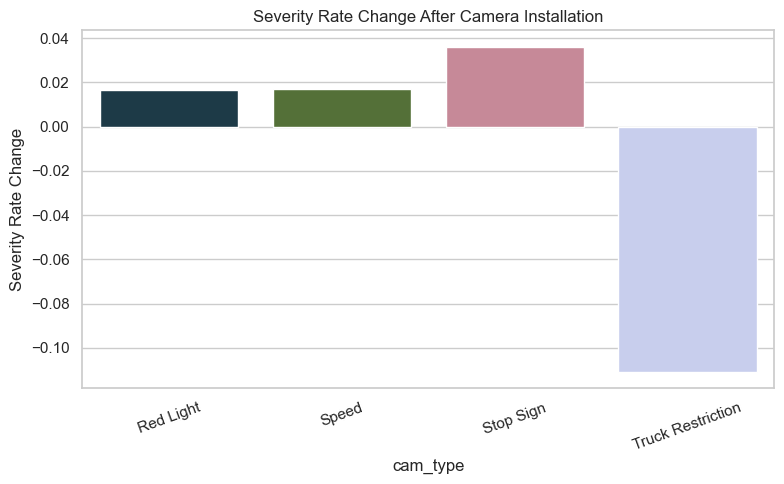

In [98]:
# -----------------------------------------
# SEVERITY CHANGE BY CAMERA TYPE
# -----------------------------------------

df_sev = df_w.groupby("cam_type").agg({
    "severe_rate_pre": "mean",
    "severe_rate_post": "mean"
})

df_sev["sev_delta"] = df_sev["severe_rate_post"] - df_sev["severe_rate_pre"]

plt.figure(figsize=(8,5))
sns.barplot(
    data=df_sev.reset_index(),
    x="cam_type",
    y="sev_delta",
    palette="cubehelix"
)
plt.title("Severity Rate Change After Camera Installation")
plt.ylabel("Severity Rate Change")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()


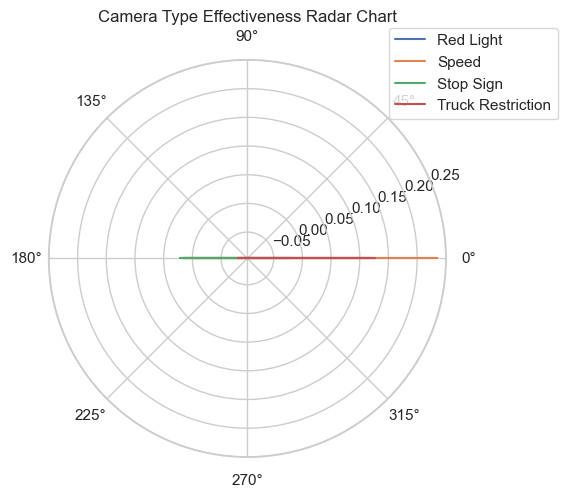

In [100]:
# -----------------------------------------
# RADAR CHART — CAMERA EFFECTIVENESS
# -----------------------------------------

radar_df = df_w.groupby("cam_type").agg({
    "crash_delta_pct": "mean",
    "sev_rate_delta_abs": "mean"
})

categories = radar_df.columns.tolist()
N = len(categories)

angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
angles += angles[:1]

plt.figure(figsize=(6,6))

for cam in radar_df.index:
    values = radar_df.loc[cam].tolist()
    values += values[:1]
    plt.polar(angles, values, label=cam)

plt.title("Camera Type Effectiveness Radar Chart")
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.tight_layout()
plt.show()


In [108]:

df = pd.read_csv('/Users/aaquil/Downloads/crashesClean.csv')
df.head()


,REPORTDATE,FROMDATE,ADDRESS,LATITUDE,LONGITUDE,WARD,TOTAL_VEHICLES,TOTAL_BICYCLES,TOTAL_PEDESTRIANS,NEARESTINTSTREETNAME,...,crash_datetime,year,month,weekday,fatalities,majorinjuries,minorinjuries,speeding,impaired,severity
0,2011-04-11 06:19:00+00:00,2011-04-10 04:00:00+00:00,800 KENILWORTH AVE NE,38.901131,-76.945592,Ward 7,1,0,0,JAY ST NE,...,2011-04-10 04:00:00+00:00,2011,4,Sunday,0.0,0.0,0.0,0,0,Property Damage Only
1,2011-04-11 20:00:00+00:00,2011-04-11 04:00:00+00:00,1100 13TH ST NW,38.904346,-77.030259,Ward 2,2,0,0,Unknown,...,2011-04-11 04:00:00+00:00,2011,4,Monday,0.0,0.0,0.0,0,0,Property Damage Only
2,2011-04-14 00:00:00+00:00,2011-04-12 04:00:00+00:00,1400 FIRST ST. NE,38.909074,-77.013661,Ward 5,2,0,0,Unknown,...,2011-04-12 04:00:00+00:00,2011,4,Tuesday,0.0,0.0,0.0,0,0,Property Damage Only
3,2011-04-12 04:00:00+00:00,2011-04-12 04:00:00+00:00,415 MICHIGAN AVE NE,38.931208,-76.999755,Ward 5,2,0,0,Unknown,...,2011-04-12 04:00:00+00:00,2011,4,Tuesday,0.0,0.0,1.0,0,0,Injury
4,2011-04-13 18:55:00+00:00,2011-04-13 04:00:00+00:00,3000 BLOCK OF SOUTH DAKOTA AVENUE NE,38.929546,-76.969746,Ward 5,3,0,0,IRVING ST NE,...,2011-04-13 04:00:00+00:00,2011,4,Wednesday,0.0,0.0,0.0,0,0,Property Damage Only


In [112]:

# Load your crash dataset from your Downloads folder
crash = pd.read_csv('/Users/aaquil/Downloads/crashesClean.csv')

crash.head()


,REPORTDATE,FROMDATE,ADDRESS,LATITUDE,LONGITUDE,WARD,TOTAL_VEHICLES,TOTAL_BICYCLES,TOTAL_PEDESTRIANS,NEARESTINTSTREETNAME,...,crash_datetime,year,month,weekday,fatalities,majorinjuries,minorinjuries,speeding,impaired,severity
0,2011-04-11 06:19:00+00:00,2011-04-10 04:00:00+00:00,800 KENILWORTH AVE NE,38.901131,-76.945592,Ward 7,1,0,0,JAY ST NE,...,2011-04-10 04:00:00+00:00,2011,4,Sunday,0.0,0.0,0.0,0,0,Property Damage Only
1,2011-04-11 20:00:00+00:00,2011-04-11 04:00:00+00:00,1100 13TH ST NW,38.904346,-77.030259,Ward 2,2,0,0,Unknown,...,2011-04-11 04:00:00+00:00,2011,4,Monday,0.0,0.0,0.0,0,0,Property Damage Only
2,2011-04-14 00:00:00+00:00,2011-04-12 04:00:00+00:00,1400 FIRST ST. NE,38.909074,-77.013661,Ward 5,2,0,0,Unknown,...,2011-04-12 04:00:00+00:00,2011,4,Tuesday,0.0,0.0,0.0,0,0,Property Damage Only
3,2011-04-12 04:00:00+00:00,2011-04-12 04:00:00+00:00,415 MICHIGAN AVE NE,38.931208,-76.999755,Ward 5,2,0,0,Unknown,...,2011-04-12 04:00:00+00:00,2011,4,Tuesday,0.0,0.0,1.0,0,0,Injury
4,2011-04-13 18:55:00+00:00,2011-04-13 04:00:00+00:00,3000 BLOCK OF SOUTH DAKOTA AVENUE NE,38.929546,-76.969746,Ward 5,3,0,0,IRVING ST NE,...,2011-04-13 04:00:00+00:00,2011,4,Wednesday,0.0,0.0,0.0,0,0,Property Damage Only


In [118]:
# ---------------------------------------------------------
# WARD-LEVEL CAMERA EXPANSION ANALYSIS (CORRECTED FOR YOUR DATA)
# ---------------------------------------------------------

import pandas as pd

# Load crash dataset
crash = pd.read_csv('/Users/aaquil/Downloads/crashesClean.csv')

# Severe crash metric
crash["severe"] = crash["majorinjuries"] + crash["fatalities"]

# PRE / POST YEARS
pre_years = list(range(2011, 2018))
post_years = list(range(2018, 2025))

ward_pre = crash[crash["year"].isin(pre_years)].groupby("WARD")["severe"].sum().rename("severe_pre")
ward_post = crash[crash["year"].isin(post_years)].groupby("WARD")["severe"].sum().rename("severe_post")

# Load camera dataset
cam = pd.read_csv('/Users/aaquil/Downloads/Automated_Traffic_Enforcement_Table.csv')

# Clean WARD column (remove spaces etc.)
cam["WARD"] = cam["WARD"].astype(str).str.strip()

# SITE_CODE = camera ID
cam["SITE_CODE"] = cam["SITE_CODE"].astype(str)

# Count cameras per ward
cameras_per_ward = cam.groupby("WARD")["SITE_CODE"].count().rename("camera_count")

# Combine
ward_df = pd.concat([ward_pre, ward_post, cameras_per_ward], axis=1)

# Compute impact
ward_df["severity_change"] = ward_df["severe_post"] - ward_df["severe_pre"]
ward_df["crashes_per_camera"] = ward_df["severe_post"] / ward_df["camera_count"]

# Rank wards where DC should add more cameras
ward_df["priority_rank"] = ward_df["crashes_per_camera"].rank(ascending=False)

ward_df.sort_values("priority_rank")


,severe_pre,severe_post,camera_count,severity_change,crashes_per_camera,priority_rank
WARD,,,,,,
Null,332.0,0.0,NaN,-332.0,NaN,NaN
Ward 1,1802.0,222.0,NaN,-1580.0,NaN,NaN
Ward 2,3555.0,466.0,NaN,-3089.0,NaN,NaN
Ward 3,1079.0,144.0,NaN,-935.0,NaN,NaN
Ward 4,1843.0,215.0,NaN,-1628.0,NaN,NaN
Ward 5,3200.0,432.0,NaN,-2768.0,NaN,NaN
Ward 6,2564.0,400.0,NaN,-2164.0,NaN,NaN
Ward 7,2844.0,579.0,NaN,-2265.0,NaN,NaN
Ward 8,2017.0,474.0,NaN,-1543.0,NaN,NaN


In [120]:
# FIX WARD MERGE ISSUE — FINAL VERSION

crash = crash.copy()
cam = cam.copy()

# ---------- CRASH WARD CLEAN ----------
# crash ward looks like: "Ward 1", "Ward 2"
crash["WARD_CLEAN"] = (
    crash["WARD"]
    .astype(str)
    .str.upper()
    .str.replace("WARD", "", regex=False)
    .str.strip()
)

# convert to integer if possible
crash["WARD_CLEAN"] = pd.to_numeric(crash["WARD_CLEAN"], errors="coerce")

# ---------- CAMERA WARD CLEAN ----------
# cam ward looks like: 1.0, 2.0, "5", NaN
cam["WARD_CLEAN"] = pd.to_numeric(cam["WARD"], errors="coerce")

# keep only wards 1–8 (valid DC wards)
crash = crash[crash["WARD_CLEAN"].isin(range(1, 9))]
cam = cam[cam["WARD_CLEAN"].isin(range(1, 9))]

# ---------- SEVERE CRASH BEFORE / AFTER ----------
crash["severe"] = crash["majorinjuries"] + crash["fatalities"]

pre_years = list(range(2011, 2018))
post_years = list(range(2018, 2025))

ward_pre = crash[crash["year"].isin(pre_years)].groupby("WARD_CLEAN")["severe"].sum().rename("severe_pre")
ward_post = crash[crash["year"].isin(post_years)].groupby("WARD_CLEAN")["severe"].sum().rename("severe_post")

# ---------- CAMERA COUNT PER WARD ----------
cam_count = cam.groupby("WARD_CLEAN")["SITE_CODE"].count().rename("camera_count")

# ---------- COMBINE ----------
ward_df = pd.concat([ward_pre, ward_post, cam_count], axis=1)

# ---------- METRICS ----------
ward_df["severity_change"] = ward_df["severe_post"] - ward_df["severe_pre"]
ward_df["crashes_per_camera"] = ward_df["severe_post"] / ward_df["camera_count"]
ward_df["priority_rank"] = ward_df["crashes_per_camera"].rank(ascending=False)

ward_df


,severe_pre,severe_post,camera_count,severity_change,crashes_per_camera,priority_rank
WARD_CLEAN,,,,,,
1.0,1802.0,222.0,21,-1580.0,10.571429,4.0
2.0,3555.0,466.0,33,-3089.0,14.121212,2.0
3.0,1079.0,144.0,28,-935.0,5.142857,8.0
4.0,1843.0,215.0,34,-1628.0,6.323529,6.0
5.0,3200.0,432.0,69,-2768.0,6.260870,7.0
6.0,2564.0,400.0,20,-2164.0,20.000000,1.0
7.0,2844.0,579.0,68,-2265.0,8.514706,5.0
8.0,2017.0,474.0,38,-1543.0,12.473684,3.0


In [138]:
best_10 = df.sort_values("crash_delta").head(10)
best_10


,cam_id,cam_type,crashes_post,crashes_pre,severe_rate_post,severe_rate_pre,crash_reduction,crash_delta_pct,sev_rate_delta_abs,crash_delta,severity_delta
210,ATE 0588,Red Light,17.0,37.0,0.470588,0.189189,1,-0.540541,0.281399,-20.0,0.281399
177,ATE 0553,Speed,14.0,29.0,0.500000,0.206897,1,-0.517241,0.293103,-15.0,0.293103
124,ATE 0363,Speed,4.0,19.0,0.000000,0.105263,1,-0.789474,-0.105263,-15.0,-0.105263
228,ATE 0606,Red Light,30.0,45.0,0.233333,0.288889,1,-0.333333,-0.055556,-15.0,-0.055556
89,ATE 0260,Speed,18.0,32.0,0.500000,0.125000,1,-0.437500,0.375000,-14.0,0.375000
174,ATE 0549,Speed,17.0,29.0,0.352941,0.275862,1,-0.413793,0.077079,-12.0,0.077079
97,ATE 0291,Speed,3.0,15.0,0.666667,0.266667,1,-0.800000,0.400000,-12.0,0.400000
105,ATE 0320,Speed,15.0,26.0,0.533333,0.423077,1,-0.423077,0.110256,-11.0,0.110256
248,ATE 0805,Red Light,39.0,50.0,0.230769,0.260000,1,-0.220000,-0.029231,-11.0,-0.029231
26,ATE 0082,Speed,22.0,33.0,0.136364,0.303030,1,-0.333333,-0.166667,-11.0,-0.166667


In [140]:
worst_10 = df.sort_values("crash_delta", ascending=False).head(10)
worst_10


,cam_id,cam_type,crashes_post,crashes_pre,severe_rate_post,severe_rate_pre,crash_reduction,crash_delta_pct,sev_rate_delta_abs,crash_delta,severity_delta
138,ATE 0444,Red Light,31.0,11.0,0.322581,0.272727,0,1.818182,0.049853,20.0,0.049853
123,ATE 0359,Speed,50.0,34.0,0.180000,0.264706,0,0.470588,-0.084706,16.0,-0.084706
30,ATE 0094,Speed,43.0,30.0,0.302326,0.266667,0,0.433333,0.035659,13.0,0.035659
135,ATE 0408,Red Light,31.0,19.0,0.129032,0.105263,0,0.631579,0.023769,12.0,0.023769
18,ATE 0057,Speed,26.0,14.0,0.269231,0.214286,0,0.857143,0.054945,12.0,0.054945
126,ATE 0365,Speed,23.0,12.0,0.217391,0.250000,0,0.916667,-0.032609,11.0,-0.032609
133,ATE 0403,Red Light,18.0,8.0,0.388889,0.375000,0,1.250000,0.013889,10.0,0.013889
25,ATE 0079,Speed,26.0,16.0,0.153846,0.062500,0,0.625000,0.091346,10.0,0.091346
165,ATE 0532,Speed,29.0,20.0,0.344828,0.450000,0,0.450000,-0.105172,9.0,-0.105172
215,ATE 0593,Red Light,86.0,78.0,0.209302,0.243590,0,0.102564,-0.034287,8.0,-0.034287


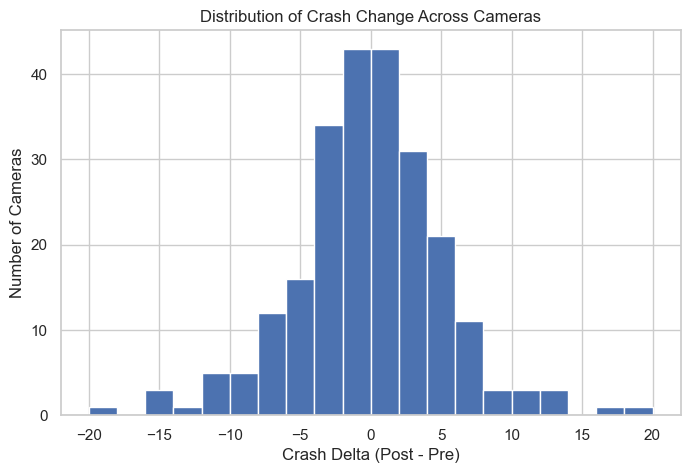

In [142]:

plt.figure(figsize=(8,5))
plt.hist(df["crash_delta"], bins=20)
plt.title("Distribution of Crash Change Across Cameras")
plt.xlabel("Crash Delta (Post - Pre)")
plt.ylabel("Number of Cameras")
plt.show()


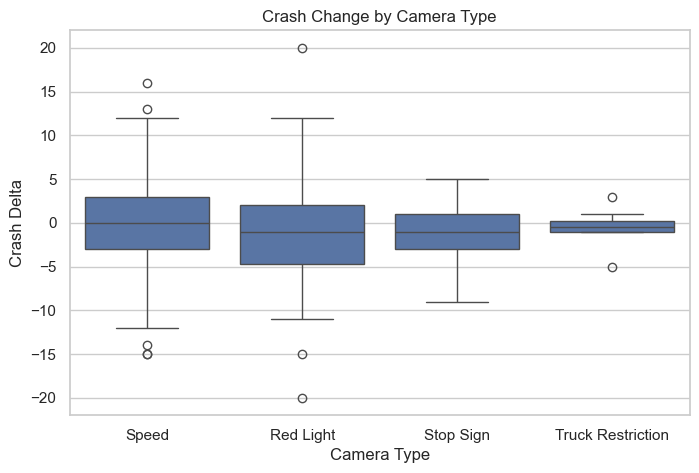

In [144]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
sns.boxplot(x="cam_type", y="crash_delta", data=df)
plt.title("Crash Change by Camera Type")
plt.xlabel("Camera Type")
plt.ylabel("Crash Delta")
plt.show()


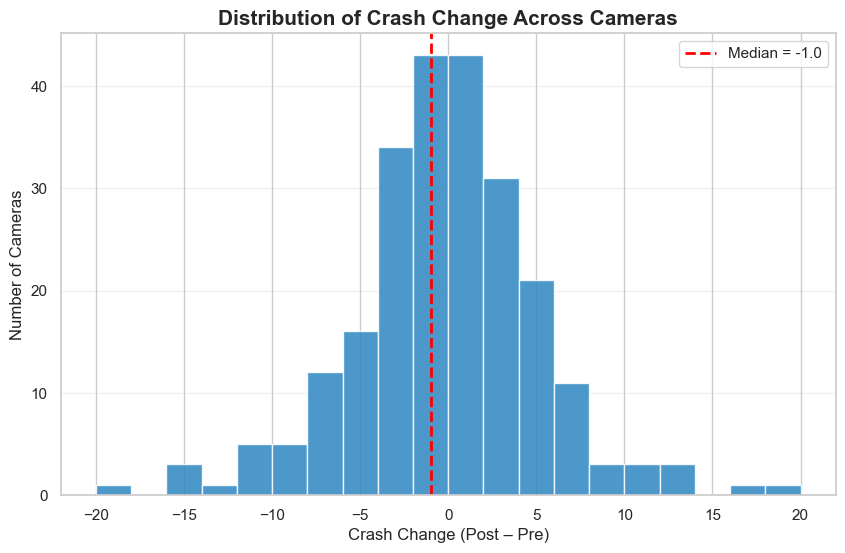

In [146]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(10,6))

# Choose a cleaner color
color = "#2E86C1"

# Plot histogram
counts, bins, patches = plt.hist(df["crash_delta"], bins=20, color=color, edgecolor="white", alpha=0.85)

# Add vertical line at median
median_val = df["crash_delta"].median()
plt.axvline(median_val, color="red", linestyle="--", linewidth=2, label=f"Median = {median_val:.1f}")

# Titles and labels
plt.title("Distribution of Crash Change Across Cameras", fontsize=15, fontweight="bold")
plt.xlabel("Crash Change (Post – Pre)", fontsize=12)
plt.ylabel("Number of Cameras", fontsize=12)

# Add grid
plt.grid(axis="y", alpha=0.3)

# Add legend
plt.legend()

plt.show()


/var/folders/1q/02swbm1j4130h2fb32g950w80000gn/T/ipykernel_19786/3967303466.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


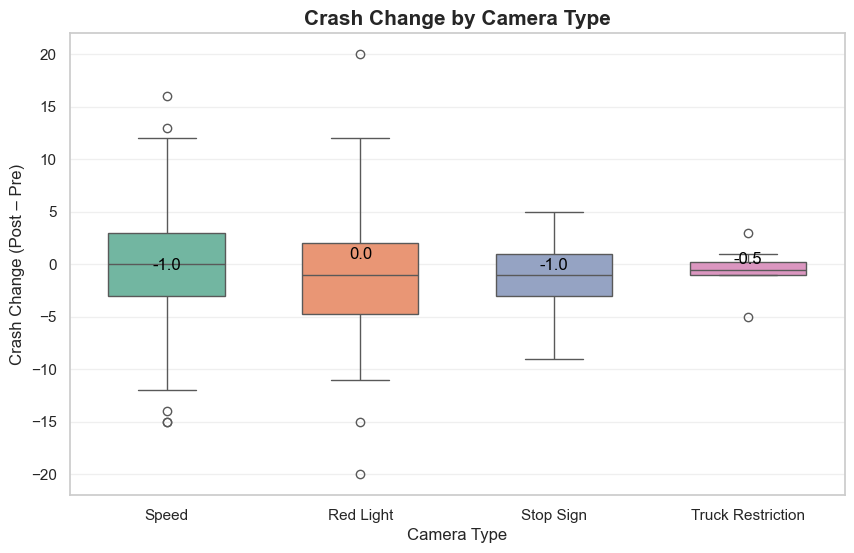

In [148]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

sns.boxplot(
    x="cam_type",
    y="crash_delta",
    data=df,
    palette="Set2",      # clean color scheme
    showfliers=True,
    width=0.6
)

plt.title("Crash Change by Camera Type", fontsize=15, fontweight="bold")
plt.xlabel("Camera Type", fontsize=12)
plt.ylabel("Crash Change (Post – Pre)", fontsize=12)
plt.grid(axis="y", alpha=0.3)

# Show median values as text above each box
medians = df.groupby("cam_type")["crash_delta"].median()
for i, (cam_type, med) in enumerate(medians.items()):
    plt.text(i, med + 0.5, f"{med:.1f}", ha='center', color="black", fontsize=12)

plt.show()


In [152]:
!pip install folium
!pip install branca


In [154]:
import folium
import pandas as pd
from folium.plugins import HeatMap

# Load your files
crash = pd.read_csv('/Users/aaquil/Downloads/crashesClean.csv')
cam   = pd.read_csv('/Users/aaquil/Downloads/Automated_Traffic_Enforcement_Table.csv')


In [156]:
m = folium.Map(location=[38.9072, -77.0369], zoom_start=12, tiles="cartodbpositron")


In [158]:
# Filter out invalid points
crash_points = crash[['LATITUDE','LONGITUDE']].dropna()

HeatMap(
    crash_points.values.tolist(),
    radius=10,
    blur=15,
    max_zoom=15
).add_to(m)


In [160]:
camera_colors = {
    "Speed": "red",
    "Red Light": "blue",
    "Stop Sign": "green",
    "Truck Restriction": "purple"
}

for _, row in cam.dropna(subset=["CAMERA_LATITUDE","CAMERA_LONGITUDE"]).iterrows():
    folium.CircleMarker(
        location=[row["CAMERA_LATITUDE"], row["CAMERA_LONGITUDE"]],
        radius=5,
        color=camera_colors.get(row["ENFORCEMENT_TYPE"], "black"),
        fill=True,
        fill_opacity=0.8,
        popup=f"Type: {row['ENFORCEMENT_TYPE']}"
    ).add_to(m)


In [162]:
# Approximate ward center points
ward_centers = {
    1: [38.929, -77.041],
    2: [38.903, -77.027],
    3: [38.955, -77.078],
    4: [38.959, -77.021],
    5: [38.916, -76.995],
    6: [38.885, -76.995],
    7: [38.889, -76.943],
    8: [38.848, -76.988],
}

# Compute crash counts per ward
crash['WARD_NUM'] = crash['WARD'].astype(str).str.extract(r'(\d)').astype(float)
ward_counts = crash.groupby("WARD_NUM").size().to_dict()

# Add labels
for ward, coords in ward_centers.items():
    folium.Marker(
        location=coords,
        icon=folium.DivIcon(html=f"""
            <div style="font-size:16pt; font-weight:bold; color:#333;">
            Ward {ward}<br>Crashes: {ward_counts.get(ward, 0)}
            </div>
        """)
    ).add_to(m)


In [164]:
m


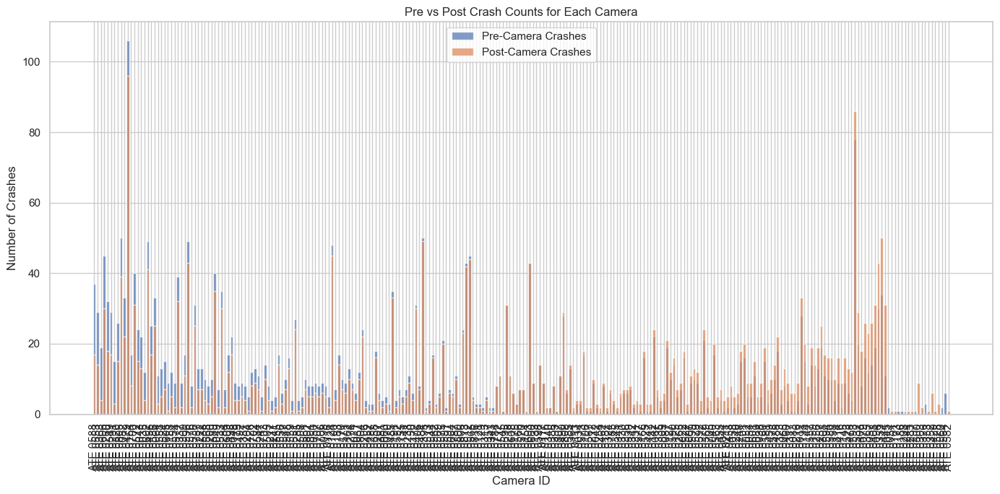

In [166]:
import matplotlib.pyplot as plt
import pandas as pd

# Sort cameras by crash delta
df_sorted = df.sort_values("crash_delta")

plt.figure(figsize=(14,7))
plt.bar(df_sorted["cam_id"], df_sorted["crashes_pre"], label="Pre-Camera Crashes", alpha=0.7)
plt.bar(df_sorted["cam_id"], df_sorted["crashes_post"], label="Post-Camera Crashes", alpha=0.7)

plt.xticks(rotation=90)
plt.xlabel("Camera ID")
plt.ylabel("Number of Crashes")
plt.title("Pre vs Post Crash Counts for Each Camera")
plt.legend()
plt.tight_layout()
plt.show()


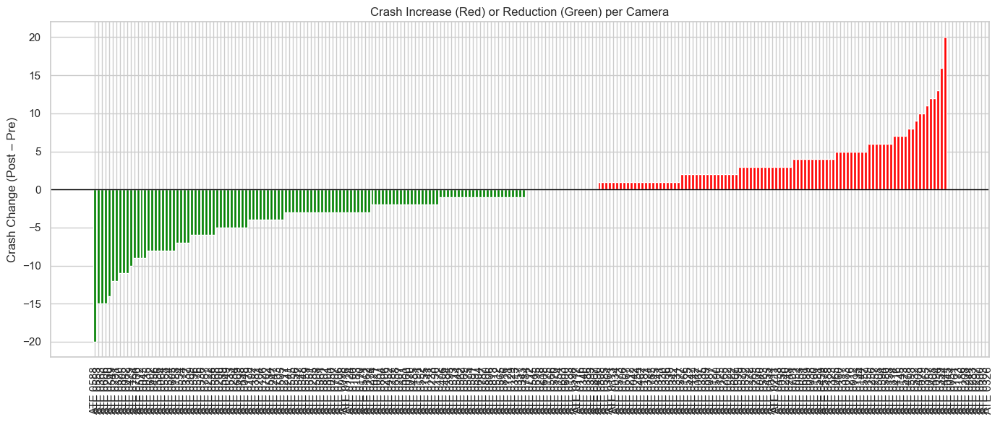

In [168]:
plt.figure(figsize=(14,6))
plt.bar(df_sorted["cam_id"], df_sorted["crash_delta"],
        color=df_sorted["crash_delta"].apply(lambda x: "red" if x>0 else "green"))

plt.axhline(0, color='black', linewidth=1)
plt.xticks(rotation=90)
plt.ylabel("Crash Change (Post – Pre)")
plt.title("Crash Increase (Red) or Reduction (Green) per Camera")
plt.tight_layout()
plt.show()


In [190]:
# Calculate absolute crash change
df["crash_delta"] = df["crashes_post"] - df["crashes_pre"]

# Identify reduction as negative values
df["crash_reduced"] = df["crash_delta"] < 0


/var/folders/1q/02swbm1j4130h2fb32g950w80000gn/T/ipykernel_19786/1372761419.py:16: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) Arial.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


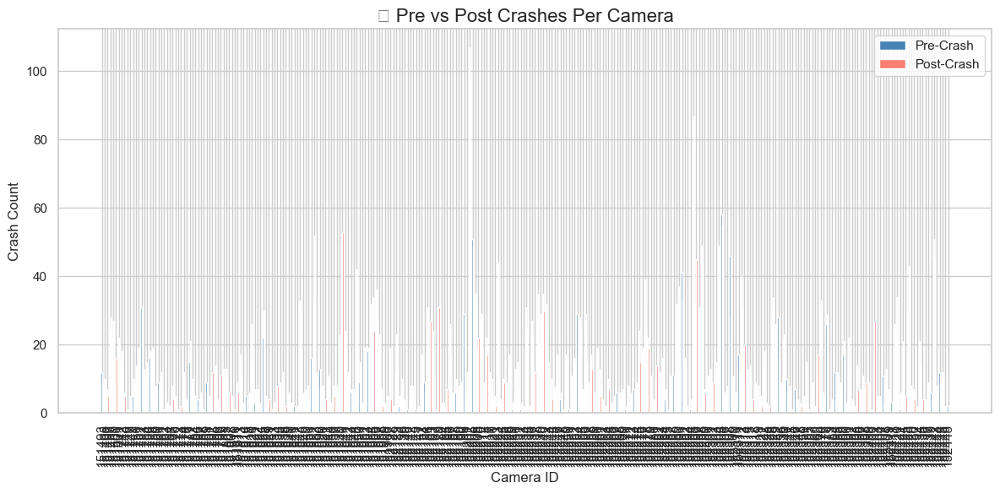

In [192]:
import numpy as np

plt.figure(figsize=(12,6))

x = np.arange(len(df))
width = 0.35

plt.bar(x - width/2, df["crashes_pre"], width, label="Pre-Crash", color="steelblue")
plt.bar(x + width/2, df["crashes_post"], width, label="Post-Crash", color="salmon")

plt.title("📉 Pre vs Post Crashes Per Camera", fontsize=16)
plt.xlabel("Camera ID")
plt.ylabel("Crash Count")
plt.xticks(x, df["cam_id"], rotation=90)
plt.legend()
plt.tight_layout()
plt.show()


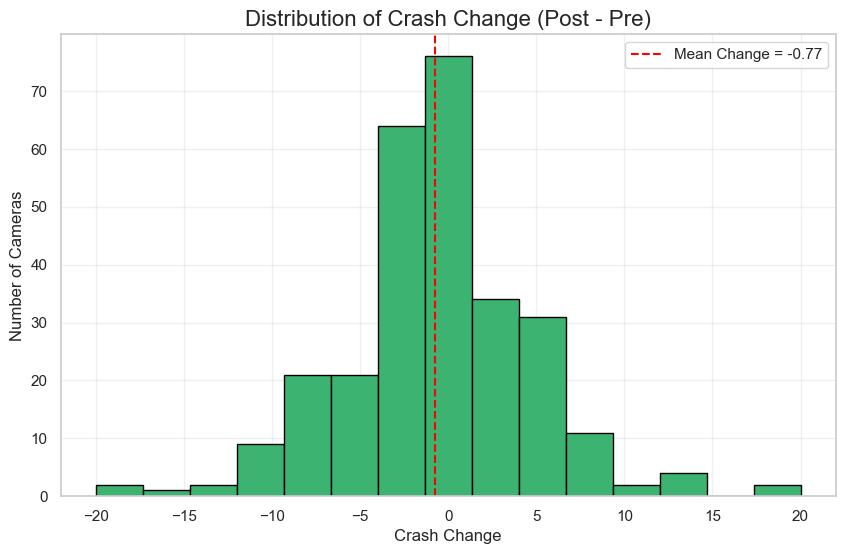

In [194]:
plt.figure(figsize=(10,6))
plt.hist(df["crash_delta"], bins=15, color="mediumseagreen", edgecolor="black")

plt.axvline(df["crash_delta"].mean(), color="red", linestyle="--", label=f"Mean Change = {df['crash_delta'].mean():.2f}")

plt.title("Distribution of Crash Change (Post - Pre)", fontsize=16)
plt.xlabel("Crash Change")
plt.ylabel("Number of Cameras")
plt.legend()
plt.grid(alpha=0.3)
plt.show()


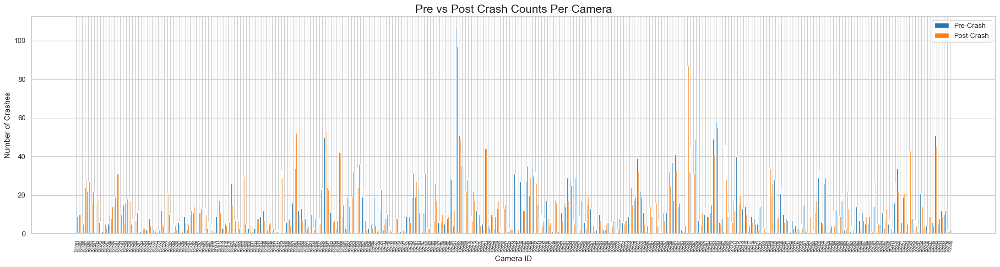

In [200]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

df = pd.read_csv("/Users/aaquil/Downloads/per_camera_prepost.csv")

plt.figure(figsize=(22, 6))

x = np.arange(len(df))  
width = 0.4

plt.bar(x - width/2, df["crashes_pre"], width, label="Pre-Crash", color="#1f77b4")
plt.bar(x + width/2, df["crashes_post"], width, label="Post-Crash", color="#ff7f0e")

plt.title("Pre vs Post Crash Counts Per Camera", fontsize=18)
plt.xlabel("Camera ID", fontsize=12)
plt.ylabel("Number of Crashes", fontsize=12)

plt.xticks(x, df["cam_id"], rotation=80, fontsize=6)
plt.legend()
plt.tight_layout()
plt.show()


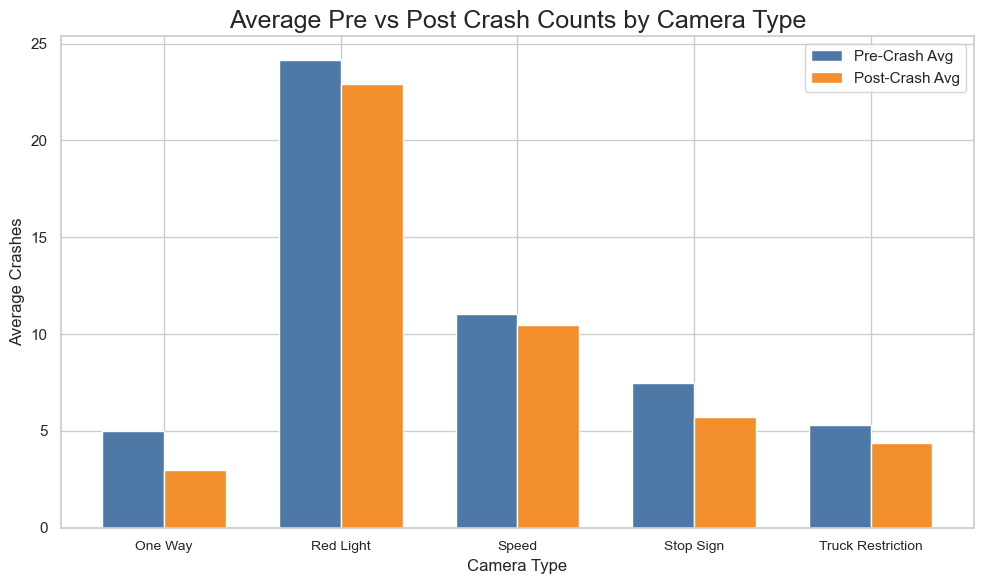

In [202]:
type_summary = df.groupby("cam_type")[["crashes_pre", "crashes_post"]].mean()

plt.figure(figsize=(10, 6))

x = np.arange(len(type_summary))
width = 0.35

plt.bar(x - width/2, type_summary["crashes_pre"], width,
        label="Pre-Crash Avg", color="#4e79a7")
plt.bar(x + width/2, type_summary["crashes_post"], width,
        label="Post-Crash Avg", color="#f28e2b")

plt.title("Average Pre vs Post Crash Counts by Camera Type", fontsize=18)
plt.xlabel("Camera Type", fontsize=12)
plt.ylabel("Average Crashes", fontsize=12)

plt.xticks(x, type_summary.index, fontsize=10)
plt.legend()
plt.tight_layout()
plt.show()


In [216]:
def evaluate_model(name, y_true, y_proba):
    # Default threshold = 0.5
    y_pred = (y_proba >= 0.5).astype(int)
    
    # Standard metrics
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc_roc = roc_auc_score(y_true, y_proba)
    
    # Precision–Recall AUC (better for imbalanced classes)
    pr_precision, pr_recall, _ = precision_recall_curve(y_true, y_proba)
    pr_auc = auc(pr_recall, pr_precision)
    
    cm = confusion_matrix(y_true, y_pred)
    
    print(f"\n=== {name} ===")
    print(f"Accuracy : {acc:.3f}")
    print(f"Precision: {prec:.3f}")
    print(f"Recall   : {rec:.3f}")
    print(f"F1 Score : {f1:.3f}")
    print(f"ROC AUC  : {auc_roc:.3f}")
    print(f"PR AUC   : {pr_auc:.3f}")
    print("Confusion Matrix:")
    print(cm)
    
    return {
        "Model": name,
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1": f1,
        "AUC": auc_roc,
        "PRAUC": pr_auc
    }


In [220]:
print(results_df.columns)
results_df.head()


Index(['Model', 'Accuracy', 'Precision', 'Recall', 'F1', 'AUC'], dtype='object')


,Model,Accuracy,Precision,Recall,F1,AUC
0,CatBoost,0.650000,0.609756,0.833333,0.704225,0.660556
1,XGBoost,0.600000,0.575000,0.766667,0.657143,0.583889
2,Gradient Boosting,0.600000,0.578947,0.733333,0.647059,0.633889
3,Random Forest,0.616667,0.600000,0.700000,0.646154,0.670556
4,RF Balanced,0.616667,0.600000,0.700000,0.646154,0.663889


In [224]:
def evaluate_model(name, y_true, y_proba):
    y_pred = (y_proba >= 0.5).astype(int)

    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc_roc = roc_auc_score(y_true, y_proba)

    # NEW: Precision–Recall AUC
    pr_precision, pr_recall, _ = precision_recall_curve(y_true, y_proba)
    pr_auc = auc(pr_recall, pr_precision)

    print(f"\n=== {name} ===")
    print(f"Accuracy : {acc:.3f}")
    print(f"Precision: {prec:.3f}")
    print(f"Recall   : {rec:.3f}")
    print(f"F1 Score : {f1:.3f}")
    print(f"ROC AUC  : {auc_roc:.3f}")
    print(f"PR AUC   : {pr_auc:.3f}")

    return {
        "Model": name,
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1": f1,
        "AUC": auc_roc,
        "PRAUC": pr_auc
    }


In [230]:
def evaluate_model(name, y_true, y_proba):
    y_pred = (y_proba >= 0.5).astype(int)

    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc_roc = roc_auc_score(y_true, y_proba)

    # PRAUC
    pr_precision, pr_recall, _ = precision_recall_curve(y_true, y_proba)
    pr_auc = auc(pr_recall, pr_precision)

    print(f"\n=== {name} ===")
    print(f"Accuracy : {acc:.3f}")
    print(f"Precision: {prec:.3f}")
    print(f"Recall   : {rec:.3f}")
    print(f"F1 Score : {f1:.3f}")
    print(f"ROC AUC  : {auc_roc:.3f}")
    print(f"PR AUC   : {pr_auc:.3f}")

    return {
        "Model": name,
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1": f1,
        "AUC": auc_roc,
        "PRAUC": pr_auc
    }


In [236]:
# Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

# -----------------------------
# 1. Logistic Regression
# -----------------------------
model_lr = LogisticRegression(max_iter=2000)
model_lr.fit(X_train, y_train)

# -----------------------------
# 2. Random Forest
# -----------------------------
model_rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    class_weight=None
)
model_rf.fit(X_train, y_train)

# -----------------------------
# 3. Balanced Random Forest
# -----------------------------
rf_balanced = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    class_weight="balanced"
)
rf_balanced.fit(X_train, y_train)

# -----------------------------
# 4. Gradient Boosting
# -----------------------------
gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(X_train, y_train)

# -----------------------------
# 5. XGBoost
# -----------------------------
xgb_model = XGBClassifier(
    n_estimators=300,
    learning_rate=0.05,
    subsample=0.8,
    max_depth=5,
    eval_metric="logloss",
    random_state=42
)
xgb_model.fit(X_train, y_train)

# -----------------------------
# 6. CatBoost
# -----------------------------
cat_model = CatBoostClassifier(
    iterations=300,
    depth=6,
    learning_rate=0.1,
    verbose=False,
    random_seed=42
)
cat_model.fit(X_train, y_train)


In [238]:
res_lr = evaluate_model("Logistic Regression", y_test, model_lr.predict_proba(X_test)[:,1])
res_rf = evaluate_model("Random Forest", y_test, model_rf.predict_proba(X_test)[:,1])
res_rfb = evaluate_model("RF Balanced", y_test, rf_balanced.predict_proba(X_test)[:,1])
res_gb = evaluate_model("Gradient Boosting", y_test, gb_model.predict_proba(X_test)[:,1])
res_xgb = evaluate_model("XGBoost", y_test, xgb_model.predict_proba(X_test)[:,1])
res_cb = evaluate_model("CatBoost", y_test, cat_model.predict_proba(X_test)[:,1])



=== Logistic Regression ===
Accuracy : 0.528
Precision: 0.542
Recall   : 0.361
F1 Score : 0.433
ROC AUC  : 0.587
PR AUC   : 0.606

=== Random Forest ===
Accuracy : 0.583
Precision: 0.583
Recall   : 0.583
F1 Score : 0.583
ROC AUC  : 0.634
PR AUC   : 0.637

=== RF Balanced ===
Accuracy : 0.583
Precision: 0.583
Recall   : 0.583
F1 Score : 0.583
ROC AUC  : 0.638
PR AUC   : 0.632

=== Gradient Boosting ===
Accuracy : 0.556
Precision: 0.548
Recall   : 0.639
F1 Score : 0.590
ROC AUC  : 0.622
PR AUC   : 0.611

=== XGBoost ===
Accuracy : 0.569
Precision: 0.564
Recall   : 0.611
F1 Score : 0.587
ROC AUC  : 0.565
PR AUC   : 0.528

=== CatBoost ===
Accuracy : 0.583
Precision: 0.579
Recall   : 0.611
F1 Score : 0.595
ROC AUC  : 0.640
PR AUC   : 0.641


In [240]:
res_lr = evaluate_model("Logistic Regression", y_test, model_lr.predict_proba(X_test)[:,1])
res_rf = evaluate_model("Random Forest", y_test, model_rf.predict_proba(X_test)[:,1])
res_rfb = evaluate_model("RF Balanced", y_test, rf_balanced.predict_proba(X_test)[:,1])
res_gb = evaluate_model("Gradient Boosting", y_test, gb_model.predict_proba(X_test)[:,1])
res_xgb = evaluate_model("XGBoost", y_test, xgb_model.predict_proba(X_test)[:,1])
res_cb = evaluate_model("CatBoost", y_test, cat_model.predict_proba(X_test)[:,1])



=== Logistic Regression ===
Accuracy : 0.528
Precision: 0.542
Recall   : 0.361
F1 Score : 0.433
ROC AUC  : 0.587
PR AUC   : 0.606

=== Random Forest ===
Accuracy : 0.583
Precision: 0.583
Recall   : 0.583
F1 Score : 0.583
ROC AUC  : 0.634
PR AUC   : 0.637

=== RF Balanced ===
Accuracy : 0.583
Precision: 0.583
Recall   : 0.583
F1 Score : 0.583
ROC AUC  : 0.638
PR AUC   : 0.632

=== Gradient Boosting ===
Accuracy : 0.556
Precision: 0.548
Recall   : 0.639
F1 Score : 0.590
ROC AUC  : 0.622
PR AUC   : 0.611

=== XGBoost ===
Accuracy : 0.569
Precision: 0.564
Recall   : 0.611
F1 Score : 0.587
ROC AUC  : 0.565
PR AUC   : 0.528

=== CatBoost ===
Accuracy : 0.583
Precision: 0.579
Recall   : 0.611
F1 Score : 0.595
ROC AUC  : 0.640
PR AUC   : 0.641


In [242]:
results_df = pd.DataFrame([
    res_lr,
    res_rf,
    res_rfb,
    res_gb,
    res_xgb,
    res_cb
])

results_df


,Model,Accuracy,Precision,Recall,F1,AUC,PRAUC
0,Logistic Regression,0.527778,0.541667,0.361111,0.433333,0.586806,0.605946
1,Random Forest,0.583333,0.583333,0.583333,0.583333,0.633873,0.636880
2,RF Balanced,0.583333,0.583333,0.583333,0.583333,0.637731,0.632176
3,Gradient Boosting,0.555556,0.547619,0.638889,0.589744,0.621914,0.610716
4,XGBoost,0.569444,0.564103,0.611111,0.586667,0.565201,0.527947
5,CatBoost,0.583333,0.578947,0.611111,0.594595,0.640046,0.641243


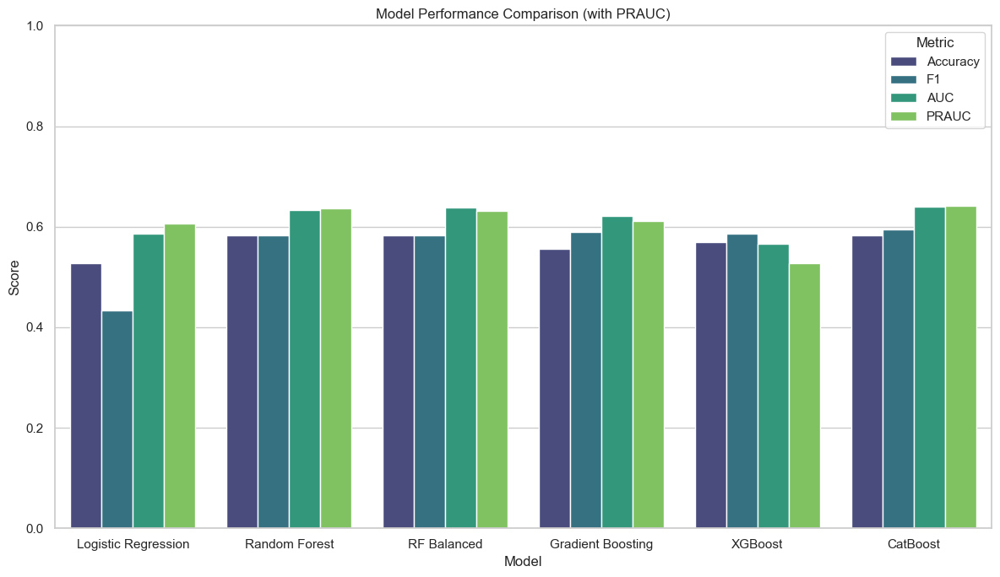

In [244]:
metrics_plot = results_df.melt(
    id_vars="Model",
    value_vars=["Accuracy", "F1", "AUC", "PRAUC"],
    var_name="Metric",
    value_name="Score"
)

plt.figure(figsize=(12,7))
sns.barplot(
    data=metrics_plot,
    x="Model", y="Score",
    hue="Metric", palette="viridis"
)
plt.title("Model Performance Comparison (with PRAUC)")
plt.ylim(0,1)
plt.tight_layout()
plt.show()


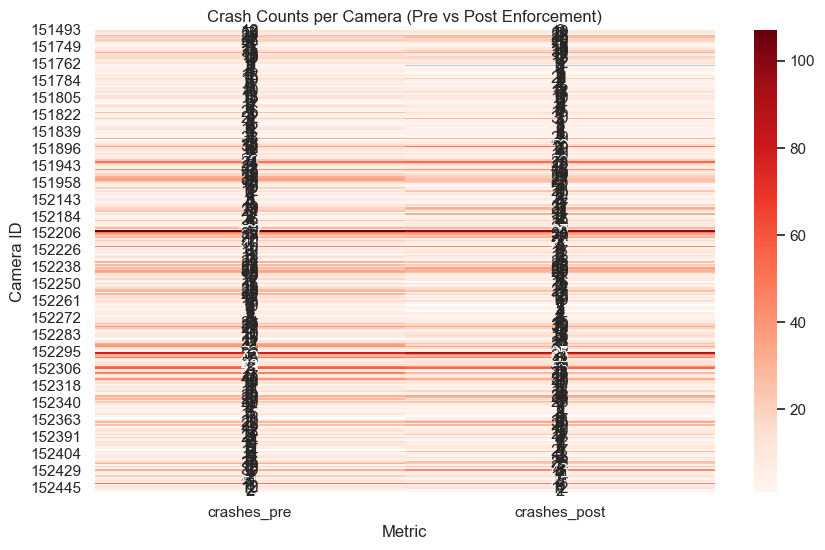

In [250]:
plt.figure(figsize=(10,6))

crash_impact = df[["cam_id", "crashes_pre", "crashes_post"]].set_index("cam_id")

sns.heatmap(
    crash_impact,
    cmap="Reds",
    annot=True,
    fmt=".0f"
)

plt.title("Crash Counts per Camera (Pre vs Post Enforcement)")
plt.ylabel("Camera ID")
plt.xlabel("Metric")
plt.show()


In [248]:
df.columns


Index(['cam_id', 'cam_type', 'crashes_pre', 'crashes_post', 'severe_rate_pre',
       'severe_rate_post', 'crash_delta_pct', 'sev_rate_delta_abs'],
      dtype='object')

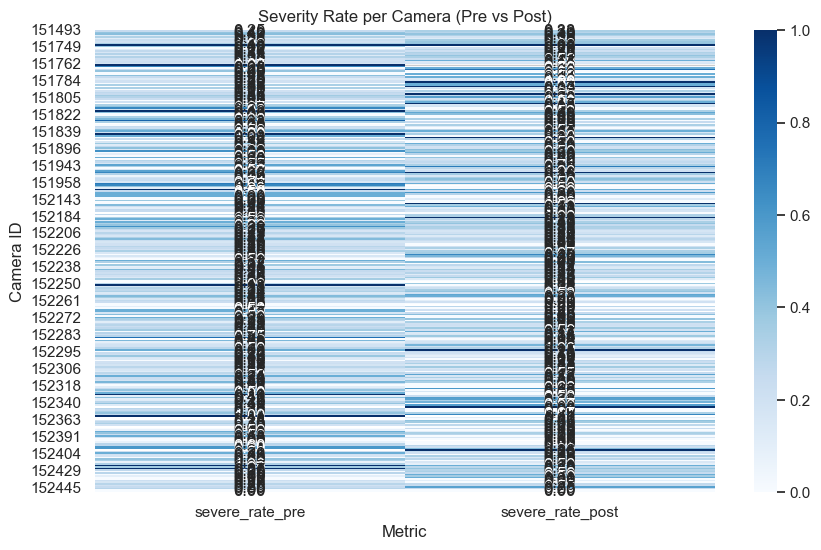

In [252]:
plt.figure(figsize=(10,6))

severity_impact = df[["cam_id", "severe_rate_pre", "severe_rate_post"]].set_index("cam_id")

sns.heatmap(
    severity_impact,
    cmap="Blues",
    annot=True,
    fmt=".2f"
)

plt.title("Severity Rate per Camera (Pre vs Post)")
plt.ylabel("Camera ID")
plt.xlabel("Metric")
plt.show()


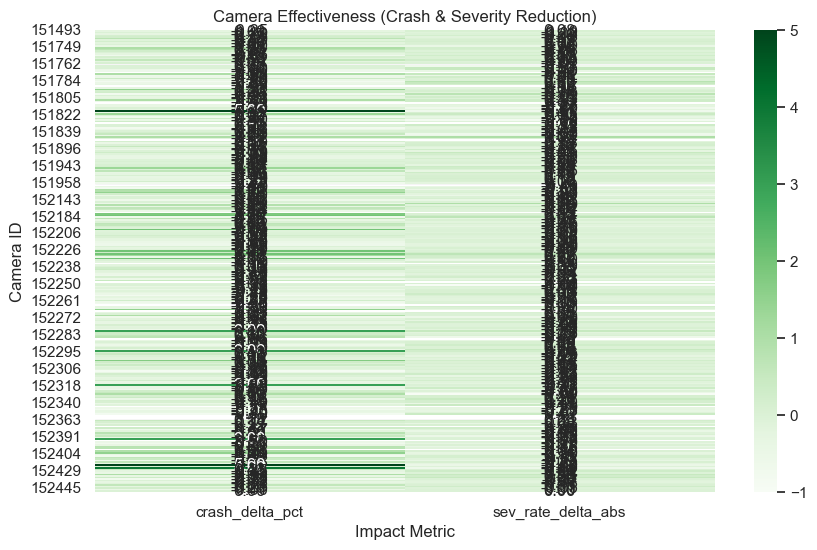

In [254]:
plt.figure(figsize=(10,6))

effectiveness = df[["cam_id", "crash_delta_pct", "sev_rate_delta_abs"]].set_index("cam_id")

sns.heatmap(
    effectiveness,
    cmap="Greens",
    annot=True,
    fmt=".2f"
)

plt.title("Camera Effectiveness (Crash & Severity Reduction)")
plt.ylabel("Camera ID")
plt.xlabel("Impact Metric")
plt.show()


In [260]:
df_crash = pd.read_csv("crashesClean.csv")
df_crash.columns


Index(['REPORTDATE', 'FROMDATE', 'ADDRESS', 'LATITUDE', 'LONGITUDE', 'WARD',
       'TOTAL_VEHICLES', 'TOTAL_BICYCLES', 'TOTAL_PEDESTRIANS',
       'NEARESTINTSTREETNAME', 'OFFINTERSECTION', 'crash_datetime', 'year',
       'month', 'weekday', 'fatalities', 'majorinjuries', 'minorinjuries',
       'speeding', 'impaired', 'severity'],
      dtype='object')

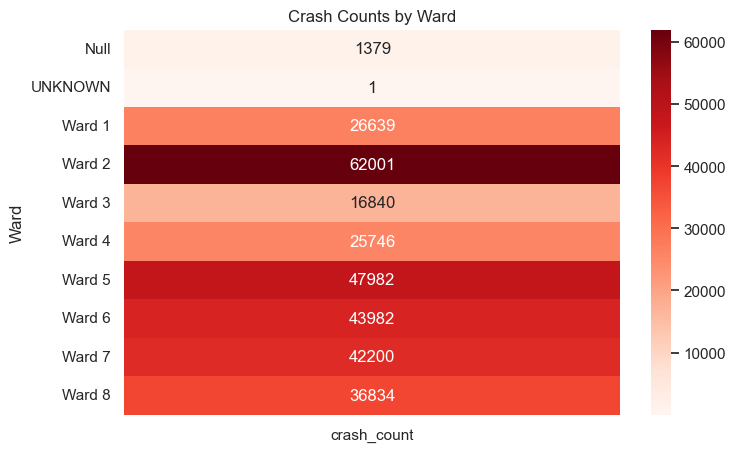

In [262]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,5))

ward_counts = df_crash.groupby("WARD").size().reset_index(name="crash_count")

sns.heatmap(
    ward_counts.pivot_table(values="crash_count", index="WARD"),
    annot=True,
    cmap="Reds",
    fmt=".0f"
)

plt.title("Crash Counts by Ward")
plt.ylabel("Ward")
plt.xlabel("")
plt.show()


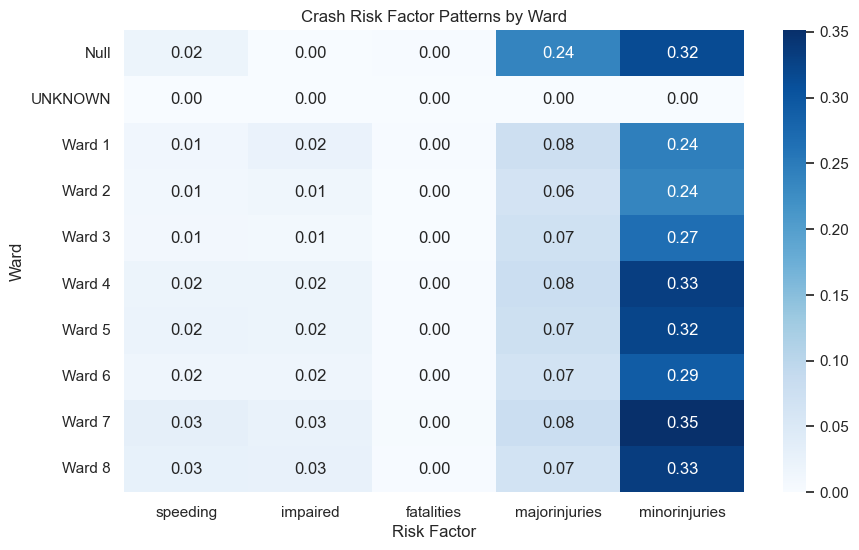

In [266]:
plt.figure(figsize=(10,6))

ward_feature_impact = df_crash.groupby("WARD")[[
    "speeding",
    "impaired",
    "fatalities",
    "majorinjuries",
    "minorinjuries"
]].mean()

sns.heatmap(
    ward_feature_impact,
    annot=True,
    cmap="Blues",
    fmt=".2f"
)

plt.title("Crash Risk Factor Patterns by Ward")
plt.xlabel("Risk Factor")
plt.ylabel("Ward")
plt.show()


In [268]:
severity_map = {
    "Property Damage Only": 1,
    "Injury": 2,
    "Fatal": 3
}

df_crash["severity_num"] = df_crash["severity"].map(severity_map)


In [270]:
df_crash[["severity", "severity_num"]].head()


,severity,severity_num
0,Property Damage Only,1
1,Property Damage Only,1
2,Property Damage Only,1
3,Injury,2
4,Property Damage Only,1


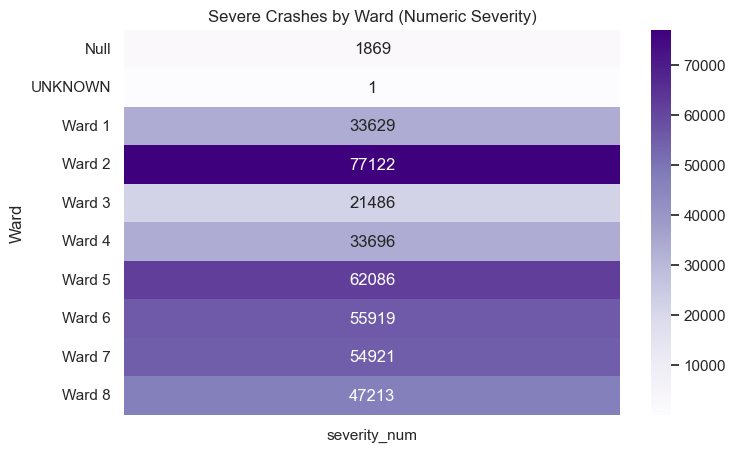

In [272]:
plt.figure(figsize=(8,5))

severe_counts = df_crash.groupby("WARD")["severity_num"].sum().reset_index()

sns.heatmap(
    severe_counts.pivot_table(values="severity_num", index="WARD"),
    annot=True,
    cmap="Purples",
    fmt=".0f"
)

plt.title("Severe Crashes by Ward (Numeric Severity)")
plt.ylabel("Ward")
plt.xlabel("")
plt.show()


In [274]:
df_crash["severe_binary"] = df_crash["severity"].isin(["Fatal", "Injury"]).astype(int)


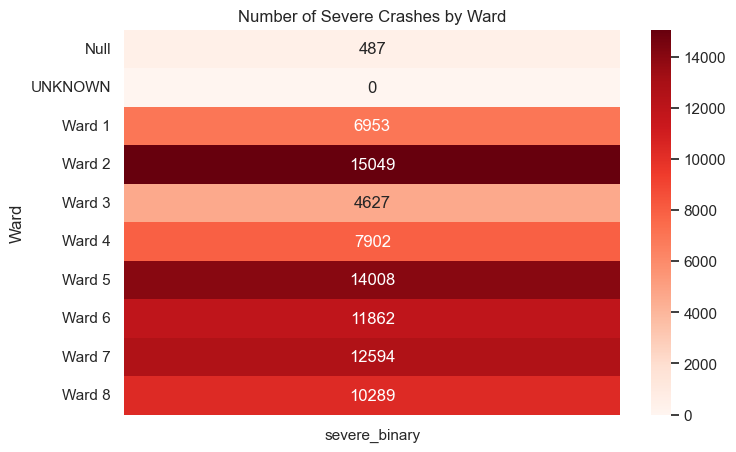

In [276]:
plt.figure(figsize=(8,5))

severe_counts = df_crash.groupby("WARD")["severe_binary"].sum().reset_index()

sns.heatmap(
    severe_counts.pivot_table(values="severe_binary", index="WARD"),
    annot=True,
    cmap="Reds",
    fmt=".0f"
)

plt.title("Number of Severe Crashes by Ward")
plt.ylabel("Ward")
plt.xlabel("")
plt.show()


In [278]:
df_crash["severe_binary"] = df_crash["severity"].isin(["Fatal", "Injury"]).astype(int)


In [280]:
ward_rates = df_crash.groupby("WARD").agg(
    total_crashes = ("severity", "count"),
    severe_crashes = ("severe_binary", "sum")
)

ward_rates["severe_rate_pct"] = (ward_rates["severe_crashes"] / ward_rates["total_crashes"]) * 100

ward_rates


,total_crashes,severe_crashes,severe_rate_pct
WARD,,,
Null,1379,487,35.315446
UNKNOWN,1,0,0.000000
Ward 1,26639,6953,26.100830
Ward 2,62001,15049,24.272189
Ward 3,16840,4627,27.476247
Ward 4,25746,7902,30.692146
Ward 5,47982,14008,29.194281
Ward 6,43982,11862,26.970124
Ward 7,42200,12594,29.843602


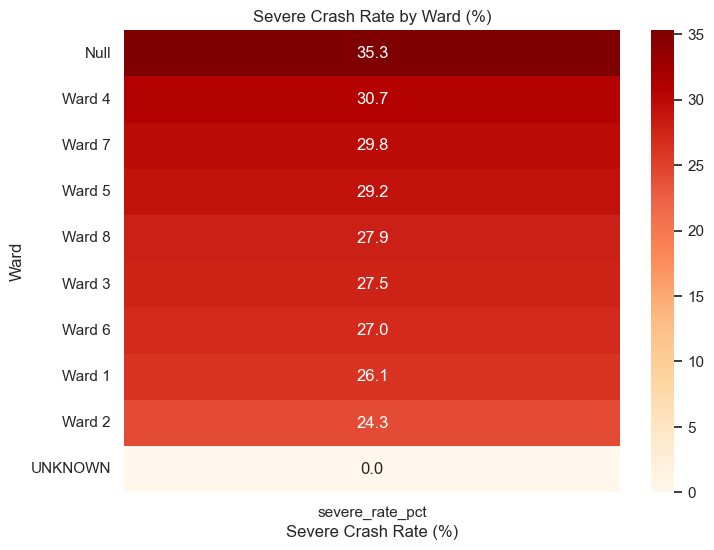

In [282]:
plt.figure(figsize=(8,6))

sns.heatmap(
    ward_rates[["severe_rate_pct"]].sort_values("severe_rate_pct", ascending=False),
    annot=True,
    cmap="OrRd",
    fmt=".1f"
)

plt.title("Severe Crash Rate by Ward (%)")
plt.ylabel("Ward")
plt.xlabel("Severe Crash Rate (%)")
plt.show()


In [284]:
df_crash["crash_datetime"] = pd.to_datetime(df_crash["crash_datetime"])

df_crash["year"] = df_crash["crash_datetime"].dt.year
df_crash["month"] = df_crash["crash_datetime"].dt.month
df_crash["weekday"] = df_crash["crash_datetime"].dt.weekday  # Monday=0
df_crash["hour"] = df_crash["crash_datetime"].dt.hour


In [286]:
import numpy as np

# Hour of day (0–23)
df_crash["hour_sin"]  = np.sin(2 * np.pi * df_crash["hour"] / 24)
df_crash["hour_cos"]  = np.cos(2 * np.pi * df_crash["hour"] / 24)

# Month of year (1–12)
df_crash["month_sin"] = np.sin(2 * np.pi * df_crash["month"] / 12)
df_crash["month_cos"] = np.cos(2 * np.pi * df_crash["month"] / 12)

# Day of week (0–6)
df_crash["weekday_sin"] = np.sin(2 * np.pi * df_crash["weekday"] / 7)
df_crash["weekday_cos"] = np.cos(2 * np.pi * df_crash["weekday"] / 7)


In [288]:
df_crash["severe_binary"] = df_crash["severity"].isin(["Fatal", "Injury"]).astype(int)


In [290]:
time_features = [
    "hour_sin", "hour_cos",
    "month_sin", "month_cos",
    "weekday_sin", "weekday_cos"
]

numeric_features = [
    "TOTAL_VEHICLES",
    "TOTAL_BICYCLES",
    "TOTAL_PEDESTRIANS",
    "fatalities",
    "majorinjuries",
    "minorinjuries",
    "speeding",
    "impaired"
]

feature_cols = time_features + numeric_features

X = df_crash[feature_cols].copy()
y = df_crash["severe_binary"]


In [292]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)


In [296]:
best_model = cat_model


In [310]:
df_cam = df.copy()

df_cam = df_cam.rename(columns={
    'severe_rate_pre': 'sev_rate_pre',
    'severe_rate_post': 'sev_rate_post'
})


In [314]:
# 1. Make a copy of the camera dataset
df_cam = df.copy()

# -----------------------------------------
# 2. RENAME columns to match CatBoost training data
# -----------------------------------------
df_cam = df_cam.rename(columns={
    'severe_rate_pre': 'sev_rate_pre',
    'severe_rate_post': 'sev_rate_post'
})

# 3. Recreate target exactly as before
y_cam = (df_cam['sev_rate_post'] > df_cam['sev_rate_pre']).astype(int)

# 4. One-hot encode cam_type (required for CatBoost input)
df_cam = pd.get_dummies(df_cam, columns=['cam_type'])

# 5. CatBoost's original features
expected_cols = [
    'crashes_pre',
    'sev_rate_pre',
    'cam_type_Speed',
    'cam_type_Stop Sign',
    'cam_type_Truck Restriction'
]

X_cam = df_cam[expected_cols]

# 6. Train/test split
from sklearn.model_selection import train_test_split

X_train_cb, X_test_cb, y_train_cb, y_test_cb = train_test_split(
    X_cam, y_cam, test_size=0.2, random_state=42
)

# 7. Overfitting metrics
from sklearn.metrics import roc_auc_score, f1_score

def get_metrics(model, X_train, y_train, X_test, y_test):
    train_prob = model.predict_proba(X_train)[:,1]
    test_prob  = model.predict_proba(X_test)[:,1]

    train_pred = model.predict(X_train)
    test_pred  = model.predict(X_test)

    return {
        "Train AUC": roc_auc_score(y_train, train_prob),
        "Test AUC": roc_auc_score(y_test, test_prob),
        "Train F1": f1_score(y_train, train_pred),
        "Test F1": f1_score(y_test, test_pred)
    }

# 8. Run overfitting evaluation
metrics = get_metrics(cat_model, X_train_cb, y_train_cb, X_test_cb, y_test_cb)
pd.DataFrame(metrics, index=["Score"]).T


,Score
Train AUC,0.574087
Test AUC,0.561942
Train F1,0.497738
Test F1,0.542373


In [316]:
import numpy as np

# Ensure crash_datetime is datetime
df_crash['crash_datetime'] = pd.to_datetime(df_crash['crash_datetime'])

# Extract time features
df_crash['hour'] = df_crash['crash_datetime'].dt.hour
df_crash['month'] = df_crash['crash_datetime'].dt.month
df_crash['weekday'] = df_crash['crash_datetime'].dt.weekday

# Cyclical encoding
df_crash['hour_sin'] = np.sin(2 * np.pi * df_crash['hour'] / 24)
df_crash['hour_cos'] = np.cos(2 * np.pi * df_crash['hour'] / 24)

df_crash['month_sin'] = np.sin(2 * np.pi * df_crash['month'] / 12)
df_crash['month_cos'] = np.cos(2 * np.pi * df_crash['month'] / 12)

df_crash['weekday_sin'] = np.sin(2 * np.pi * df_crash['weekday'] / 7)
df_crash['weekday_cos'] = np.cos(2 * np.pi * df_crash['weekday'] / 7)

print("Cyclical features added successfully!")
df_crash[['hour_sin','hour_cos','month_sin','month_cos','weekday_sin','weekday_cos']].head()


Cyclical features added successfully!


,hour_sin,hour_cos,month_sin,month_cos,weekday_sin,weekday_cos
0,0.866025,0.5,0.866025,-0.5,-0.781831,0.623490
1,0.866025,0.5,0.866025,-0.5,0.000000,1.000000
2,0.866025,0.5,0.866025,-0.5,0.781831,0.623490
3,0.866025,0.5,0.866025,-0.5,0.781831,0.623490
4,0.866025,0.5,0.866025,-0.5,0.974928,-0.222521


In [334]:

)
import warnings
warnings.filterwarnings("ignore")

# 2. LOAD DATA  
df = pd.read_csv("crashesClean.csv")

# Convert datetime if needed
df['crash_datetime'] = pd.to_datetime(df['crash_datetime'])

print("Dataset size:", df.shape)


# 3. CYCLICAL ENCODING

df['hour'] = df['crash_datetime'].dt.hour
df['month'] = df['crash_datetime'].dt.month
df['weekday'] = df['crash_datetime'].dt.weekday

df['hour_sin'] = np.sin(2 * np.pi * df['hour'] / 24)
df['hour_cos'] = np.cos(2 * np.pi * df['hour'] / 24)

df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)

df['weekday_sin'] = np.sin(2 * np.pi * df['weekday'] / 7)
df['weekday_cos'] = np.cos(2 * np.pi * df['weekday'] / 7)

print("Cyclical features added!")
df[['hour_sin','hour_cos','month_sin','month_cos','weekday_sin','weekday_cos']].head()


Dataset size: (303606, 21)
Cyclical features added!


,hour_sin,hour_cos,month_sin,month_cos,weekday_sin,weekday_cos
0,0.866025,0.5,0.866025,-0.5,-0.781831,0.623490
1,0.866025,0.5,0.866025,-0.5,0.000000,1.000000
2,0.866025,0.5,0.866025,-0.5,0.781831,0.623490
3,0.866025,0.5,0.866025,-0.5,0.781831,0.623490
4,0.866025,0.5,0.866025,-0.5,0.974928,-0.222521
